# Analyse Rotation Spectra - Hourly PSDS - autoplots

## Load Libraries

In [1]:
from andbro__querrySeismoData import __querrySeismoData

from obspy import UTCDateTime
from scipy.signal import welch
from numpy import log10, zeros, pi, append, linspace, mean, median, array, where, transpose, shape, histogram, arange
from numpy import logspace, linspace, log, log10, isinf, ones, nan, count_nonzero, sqrt, isnan
from pandas import DataFrame, concat, Series, date_range, read_csv, read_pickle
from tqdm import tqdm_notebook
from pathlib import Path
from scipy.stats import median_absolute_deviation as mad
from andbro__savefig import __savefig

import os
import pickle
import matplotlib.pyplot as plt

In [2]:
def __get_minimal_psd(psds):

    from numpy import nanmin, array, nonzero
    
    min_psd = zeros(psds.shape[1])
    
    for f in range(psds.shape[1]):
        a = psds[:,f]
        min_psd[f] = nanmin(a[nonzero(a)])
    
    return min_psd

In [3]:
def __get_median_psd(psds):

    from numpy import median, zeros, isnan

    med_psd = zeros(psds.shape[1])

    for f in range(psds.shape[1]):
        a = psds[:,f]
        med_psd[f] = median(a[~isnan(a)])

    return med_psd

In [4]:
# def __get_minimum_psd(psds, f_tmp):
    
#     from numpy import median
    
#     f_before = f_tmp[0]
#     f_tmp[0] = 1e-9
    
#     for i, psd in enumerate(psds):
#         if i == 0: 
#             lowest_value = (psd/f_tmp).sum()
#             idx = 0

#         value = (psd/f_tmp).sum() 
        
#         if value < lowest_value and value != 0:
#             lowest_value = value
#             idx = i

#     f_tmp[0] = f_before      
    
#     return psds[idx]

In [5]:
def __get_minimum_psd(psds, f_tmp):
            
    for i, psd in enumerate(psds):
        if i == 0: 
            lowest_value = psd.sum()
            idx = 0

        value = psd.sum() 
        
        if value < lowest_value and value != 0:
            lowest_value = value
            idx = i   
    
    return psds[idx]

In [6]:
# def __get_lowest_rms(psds, f_tmp):
    
#     from numpy import median
    
#     for i, psd in enumerate(psds):
#         if i == 0: 
#             lowest_value = (psd/f_tmp).sum()
#             idx = 0

#         value = (psd/f_tmp).sum() 
        
#         if value < lowest_value and value != 0:
#             lowest_value = value
#             idx = i

#     f_tmp[0] = f_before      
    
#     return psds[idx]


In [7]:
def __get_array_from_dataframe(df):
    
    from pandas import to_numeric
    
    ## convert to list
    psds = []
    for col in array(df.columns):
        
        ## turn non-float series to float objects
        df[col] = to_numeric(df[col], errors = 'coerce')

        ## add to psds list
        psds.append(array(df[col]))

    return array(psds)

In [8]:
if os.uname().nodename == "lighthouse":
    root_path = "/home/andbro/kilauea-data/"
elif os.uname().nodename == "kilauea":
    root_path = "/import/kilauea-data/"

## Configurations

In [9]:
## ---------------------------------------

name = "BSPF"
inname = "2023_BSPF_Z_3600"  ## "2022_BSPF_Z_3600"
subdir = "BSPF_2023_Z/"  ## "BSPF_2022_Z/"
threshold = 1e-13
period_limits = 1/80, 100  ## 1/50, 30

# name = "PFOIX"
# inname = "2023_PFOIX_Z_3600"
# subdir = "PFOIX_2023_Z/"
# threshold = 1e-12
# period_limits = 1/80, 100  ## 1/50, 30


## ---------------------------------------

path = f"{root_path}BSPF/data/"

## load configurations
config = pickle.load(open(path+subdir+inname+"_config.pkl", 'rb'))

config['inname'] = inname
config['inpath'] = path+subdir
config['period_limits'] = period_limits
config['thres'] = threshold
config['station'] = name

config['outpath_figures'] = f"{root_path}BSPF/figures_colorlines/"

config['frequency_limits'] = [1/config['period_limits'][1], 1/config['period_limits'][0]]

config['rlnm_model_path'] = f"{root_path}LNM/data/MODELS/"


## Methods

In [10]:
## theoretical rlnm
rlnm = read_csv(config['rlnm_model_path']+"rlnm_theory.csv")

In [11]:
def __filter_psds(psds, thresholds):
    
    from numpy import mean, array
    
    psds_filtered = []
        ## filter mean psds values
#         m_psd = mean(psd)
#         if m_psd > thresholds[0] and m_psd < thresholds[1]:
#             psds_filtered.append(psd)

    ## filter for periods larger than 20 seconds
    if mean(psd[0:63]) < thresholds[0]:
        psds_filtered.append(psd)

    print(f" -> removed {len(psds)- len(psds_filtered)} of {len(psds)} psds due to thresholds: {thresholds[0]} & {thresholds[1]}")
    return array(psds_filtered)

In [12]:
def __load_data_file(path, file):
    
    from tqdm.notebook import tqdm
    from numpy import array
    
    psds_all = []
    psds_hourly = read_pickle(path+file)
    
    for psd in psds_hourly:
        psds_all.append(psd)
        
    return array(psds_all)

In [13]:
def __cut_frequencies_array(arr, freqs, fmin, fmax):

    ind = []
    for i, f in enumerate(freqs):
        if f >= fmin and f <= fmax:
            ind.append(i)

    ff = freqs[ind[0]:ind[-1]]
    pp = arr[:,ind[0]:ind[-1]]
    
    return pp, ff 

In [14]:
def __remove_noisy_psds(arr, threshold_mean=1e-16):

    from numpy import delete, shape, sort, array
    
    l1 = shape(arr)[0]

    idx_to_remove = []
    rejected = []
    for ii in range(shape(arr)[0]):
        
        ## appy upper threshold
        if arr[ii,:].mean() > threshold_mean:
            rejected.append(arr[ii,:])
            idx_to_remove.append(ii)
            
        ## apply default lowe threshold
        if arr[ii,:].mean() < 1e-26:
            rejected.append(arr[ii,:])
            idx_to_remove.append(ii)
            
    for jj in sort(array(idx_to_remove))[::-1]:
        arr = delete(arr, jj, axis=0)  
        
    l2 = shape(arr)[0]
    
    print(f" -> removed {l1-l2} rows due to mean thresholds!")
    print(f" -> {l2} psds remain")
    
    return arr, rejected

In [15]:
def __makeplot_colorlines_overview(config, ff, psds, rejected, day):

    from tqdm.notebook import tqdm
    from numpy import isnan, median, mean, std, array, zeros
    from scipy.stats import median_abs_deviation as mad
    
#     psds_median = __get_median_psd(array(psds))
#     psds_minimal = __get_minimal_psd(array(psds))
#     psds_minimum = __get_minimum_psd(array(psds), ff)


    ## convert frequencies to periods
    pp=[]
    for mm in range(len(ff)):
        ppp = zeros(len(ff[mm]))
        ppp = 1/ff[mm]
        pp.append(ppp)
        
        
    ##____________________________
    
    NN = 3
    
    fig, axes = plt.subplots(NN,1, figsize=(10,10), sharey=False, sharex=True)

    plt.subplots_adjust(hspace=0.1)
    
    font = 14

#     N = max(psds[0].shape[0], psds[1].shape[0], psds[2].shape[0])
#     colors = plt.cm.rainbow(linspace(0, 1, N))

    N =24
    colors = plt.cm.rainbow(linspace(0,1,N))
    cmap = plt.get_cmap('rainbow', 24)
    
    
    ## add Frequency Axis
#     g = lambda x: 1/x
#     ax2 = axes[0].secondary_xaxis("top", functions=(g,g))
#     ax2.set_xlabel("  Frequency (Hz)", fontsize=font, labelpad=-1)
#     ax2.set_xticklabels(ff[2], fontsize=11)    
#     ax2.tick_params(axis='both', labelsize=font-2)
    
    
    for j in range(NN):
        for n, psd in enumerate(tqdm(psds[j])):
            axes[j].loglog(pp[j], psd, color=colors[n], alpha=0.7)
#             p2 = axes[j].scatter(pp[j][0], psd[0], s=0., c=n, cmap='rainbow', vmin=0, vmax=N)
            p2 = axes[j].scatter(pp[j][0], psd[0], s=0., c=n/N, cmap=cmap, vmin=0, vmax=N)
        
        for reject in rejected[j]:
             axes[j].loglog(pp[j],reject, color='grey', alpha=0.6, zorder=1)
                
#         axes[j].loglog(pp[j], __get_minimum_psd(psds[j], ff[j]), 'grey', zorder=3, alpha=0.9, label="Minimum")
        axes[j].loglog(pp[j], __get_median_psd(psds[j]), 'black', zorder=3, alpha=0.6, label="Median")
        
#         axes[j].loglog(rlnm['period'], rlnm['rlnm_psd_median'], color="black", zorder=2, ls="--", lw=2)
        
        axes[j].grid(True, which="both", ls="-", alpha=0.5)
        axes[j].legend(loc='lower left')
        axes[j].tick_params(labelsize=font-2)
        
#         axes[j].text(6, 2e-24, "RLNM", fontsize=font, rotation=-30)
        
#         xmin, xmax = config['period_limits'][0]-0.1*config['period_limits'][0], config['period_limits'][1]+0.05*config['period_limits'][1]
#         axes[j].set_xlim(xmin, xmax)
#         axes[j].set_ylim(bottom=8e-27)

#         axes[j].loglog([xmin, xmax], [config['thres'],config['thres']], color='grey')


        
    axes[NN-1].set_xlabel("  Period (s)", fontsize=font, labelpad=-1)

    ## panel labels
    axes[0].text(.01, .99, 'a)', ha='left', va='top', transform=axes[0].transAxes, fontsize=font+2)
    axes[1].text(.01, .99, 'b)', ha='left', va='top', transform=axes[1].transAxes, fontsize=font+2)
    axes[2].text(.01, .99, 'c)', ha='left', va='top', transform=axes[2].transAxes, fontsize=font+2)
    
    
    axes[0].set_ylabel(r"PSD$_{vertical}$ (rad$^2$/s$^2$/$Hz)$", fontsize=font)
    axes[1].set_ylabel(r"PSD$_{north}$ (rad$^2$/s$^2$/$Hz)$", fontsize=font)
    axes[2].set_ylabel(r"PSD$_{east}$ (rad$^2$/s$^2$/$Hz)$", fontsize=font)
    
    ## set colorbar at bottom
    try:
        cbar = fig.colorbar(p2, orientation='vertical', ax=axes.ravel().tolist(), aspect=50, pad=-1e-5,
                           ticks=arange(1,N,2))
    except:
        print(" -> no colorbar object!")

    plt.show();    
    return fig

## RUN for all files 

2023_BSPF_Z_3600_20230401_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


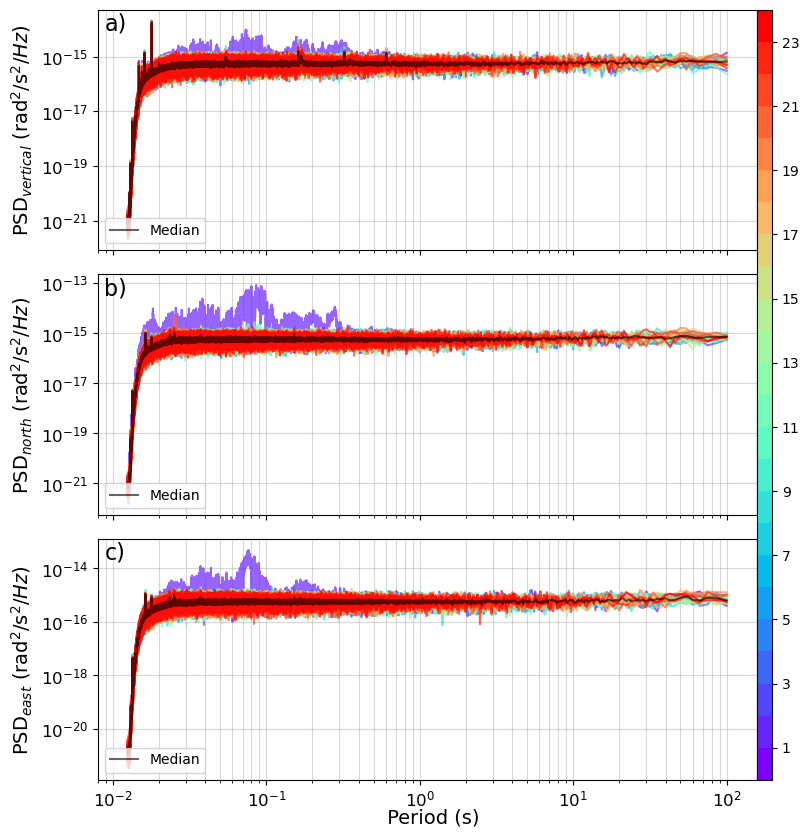


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230401.png ...

   -> Done

2023_BSPF_Z_3600_20230402_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


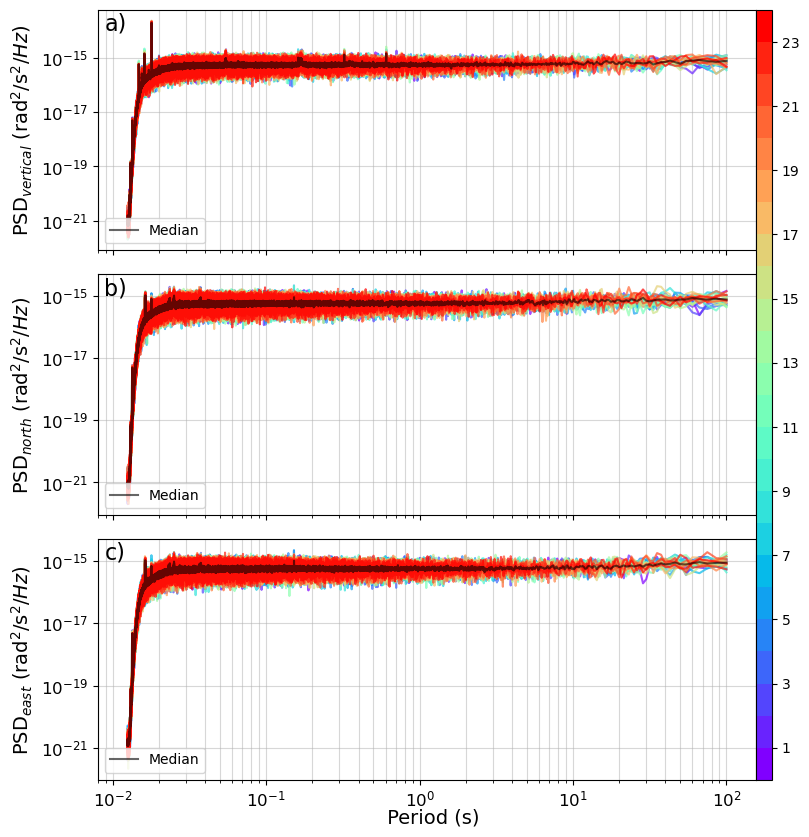


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230402.png ...

   -> Done

2023_BSPF_Z_3600_20230403_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


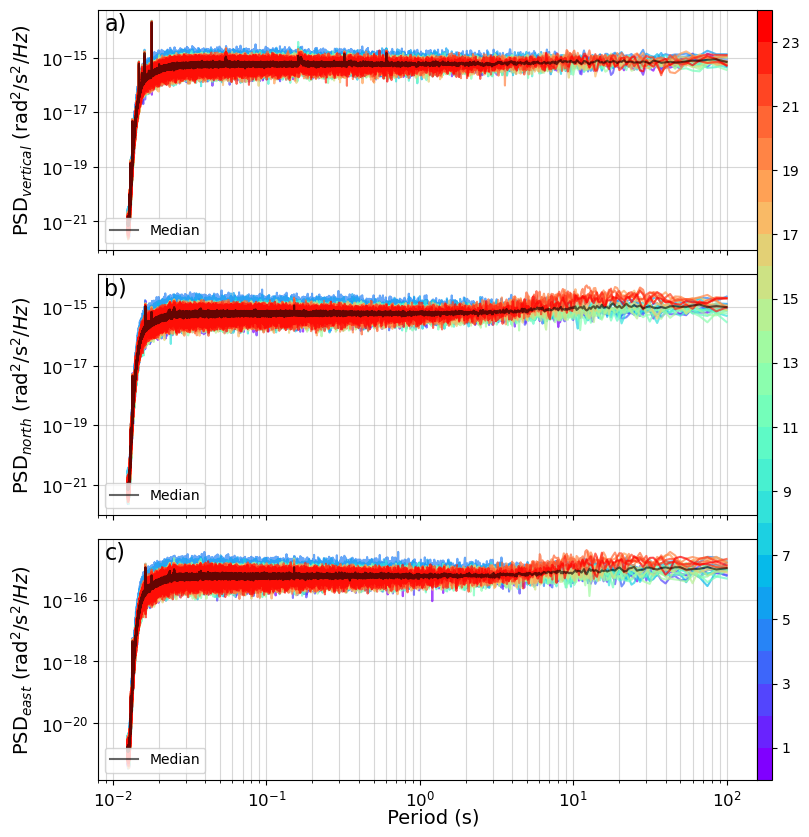


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230403.png ...

   -> Done

2023_BSPF_Z_3600_20230404_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


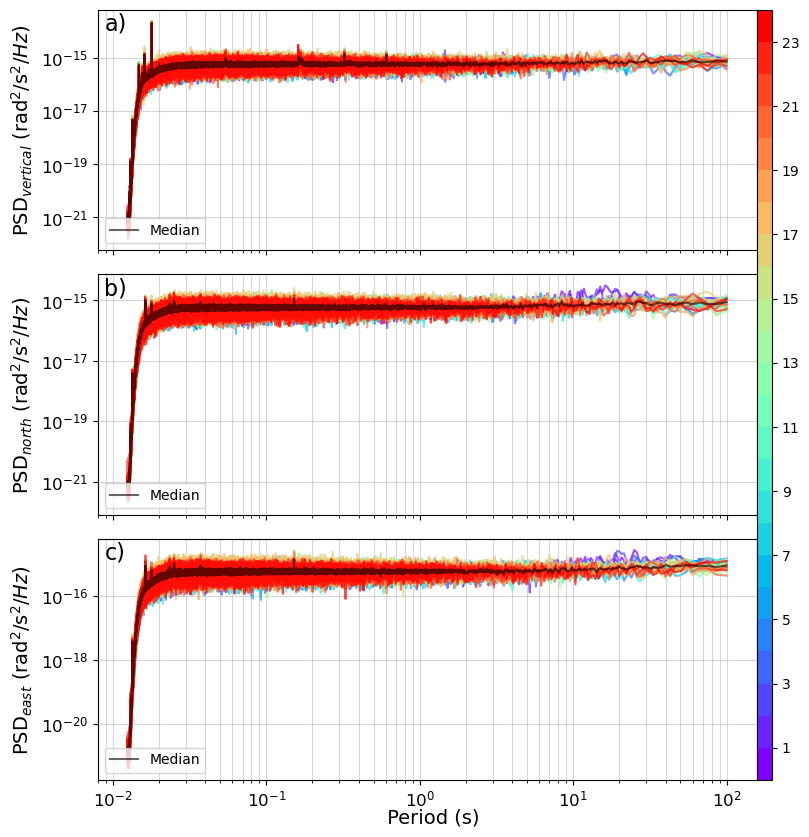


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230404.png ...

   -> Done

2023_BSPF_Z_3600_20230405_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


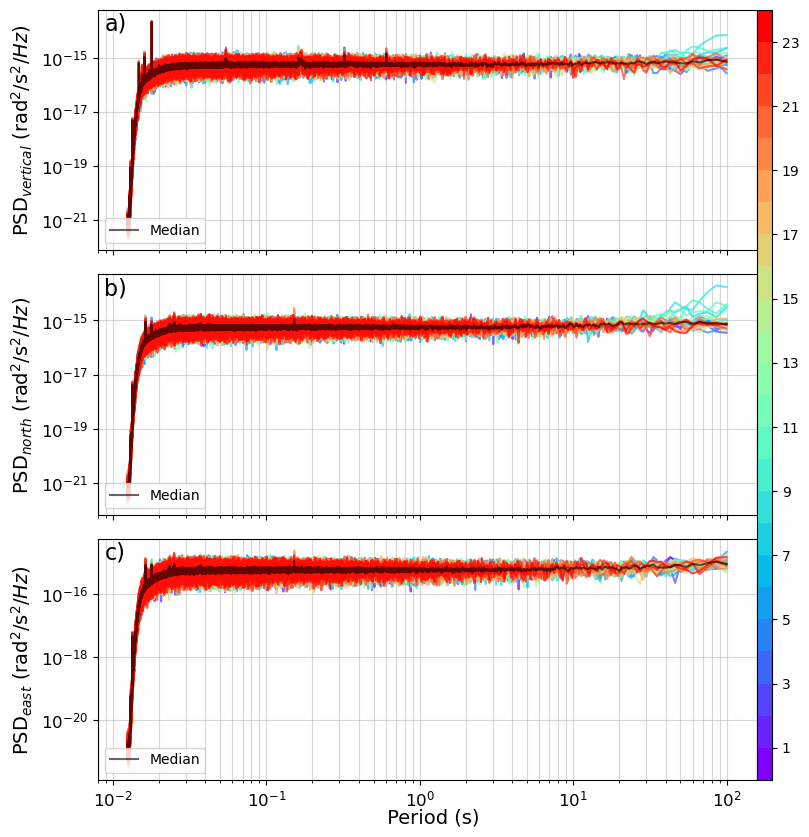


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230405.png ...

   -> Done

2023_BSPF_Z_3600_20230406_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


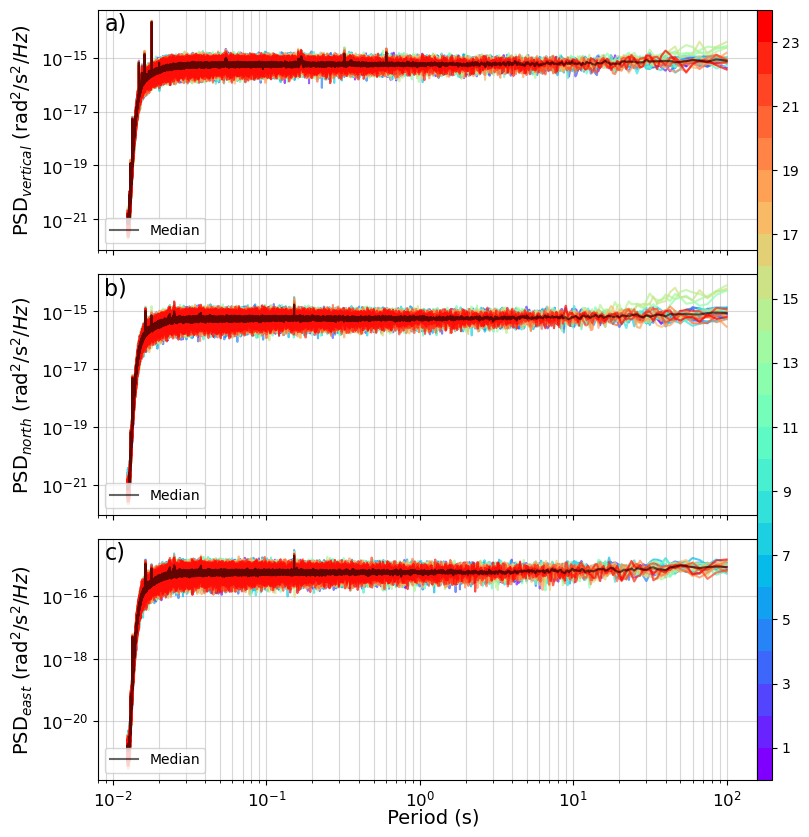


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230406.png ...

   -> Done

2023_BSPF_Z_3600_20230407_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


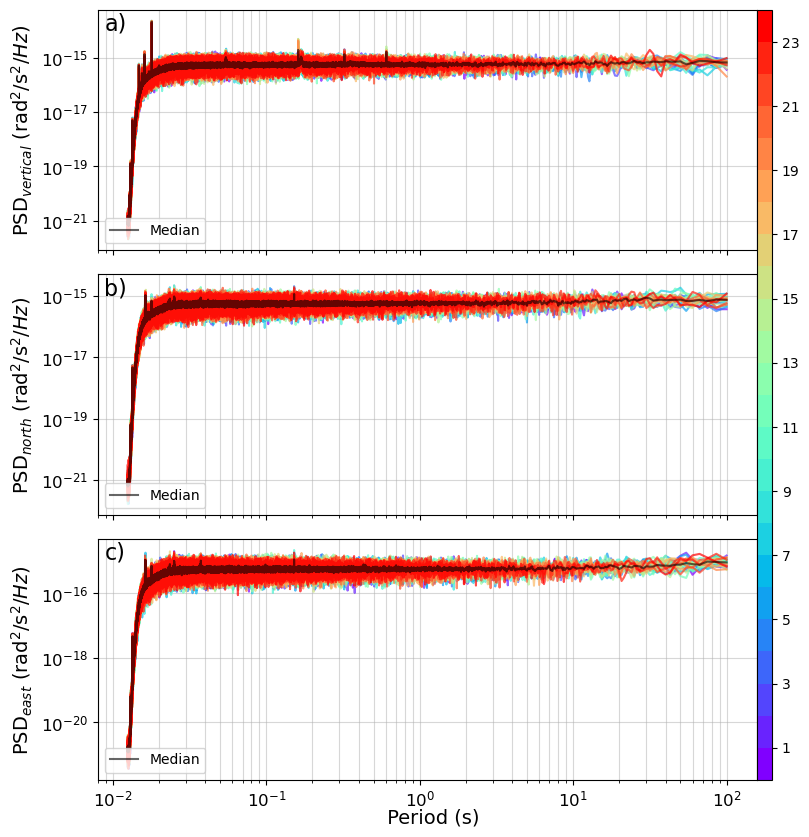


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230407.png ...

   -> Done

2023_BSPF_Z_3600_20230408_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


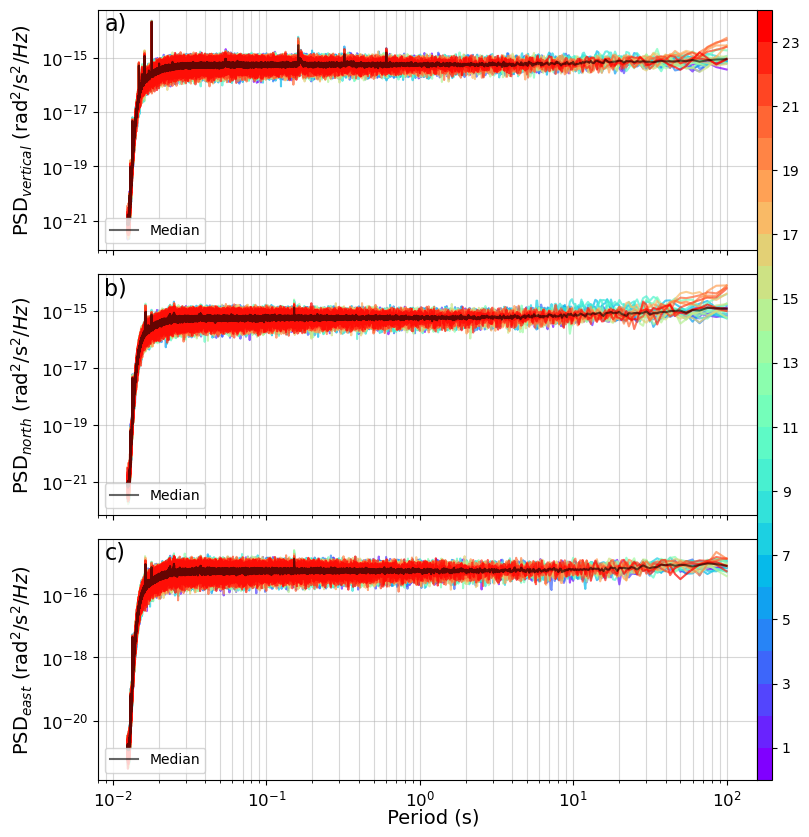


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230408.png ...

   -> Done

2023_BSPF_Z_3600_20230409_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


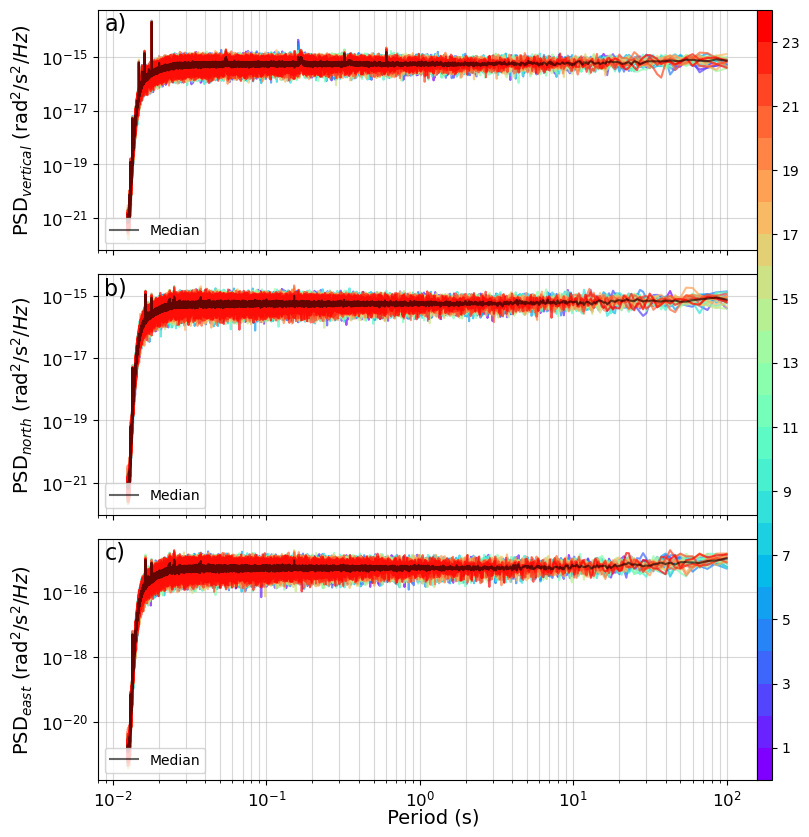


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230409.png ...

   -> Done

2023_BSPF_Z_3600_20230410_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


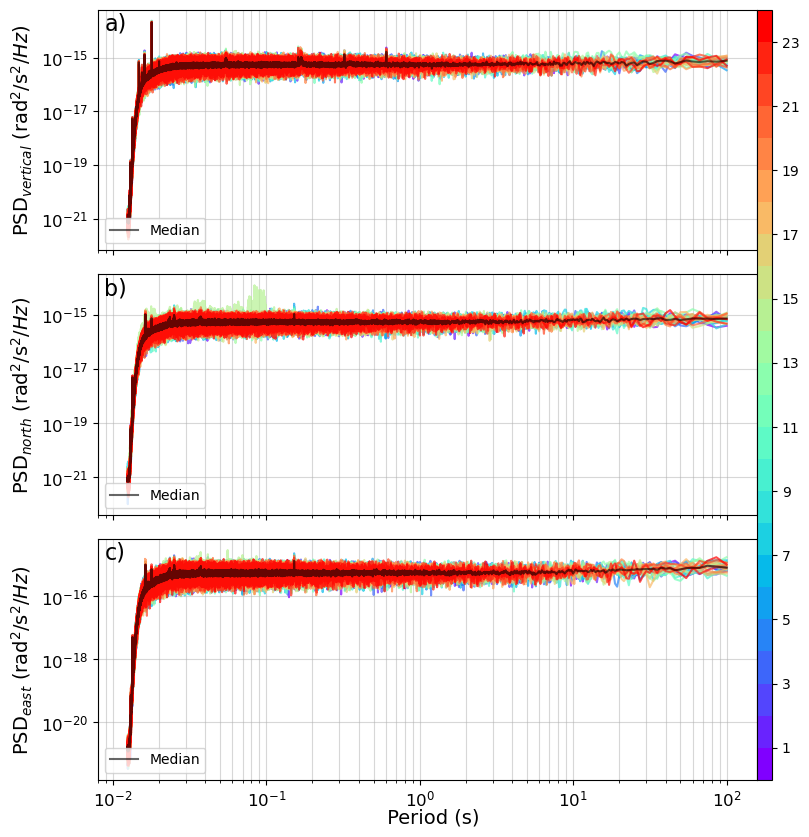


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230410.png ...

   -> Done

2023_BSPF_Z_3600_20230411_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


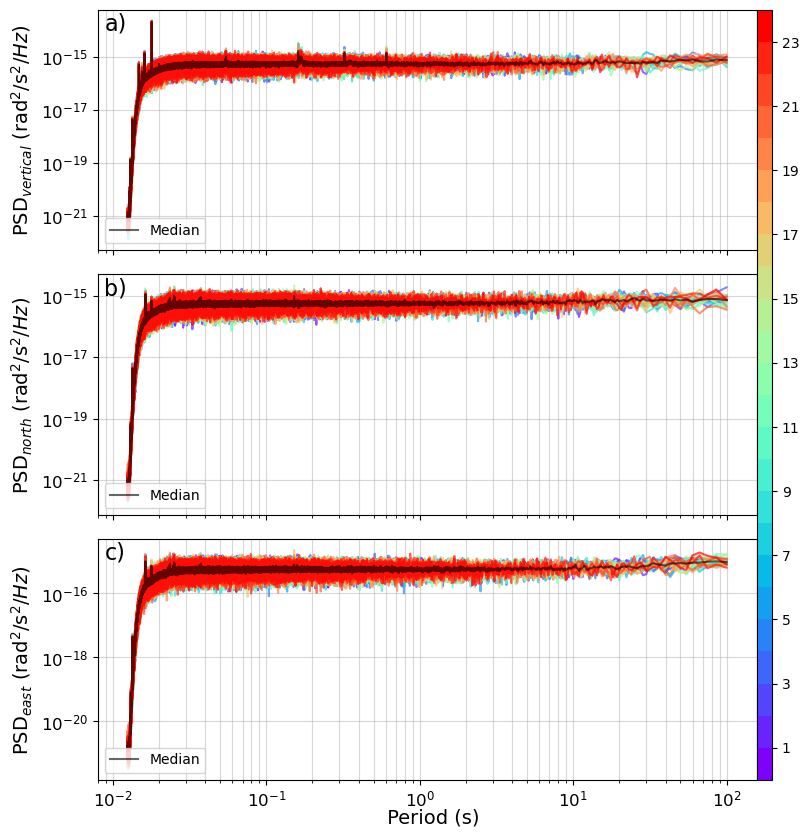


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230411.png ...

   -> Done

2023_BSPF_Z_3600_20230412_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


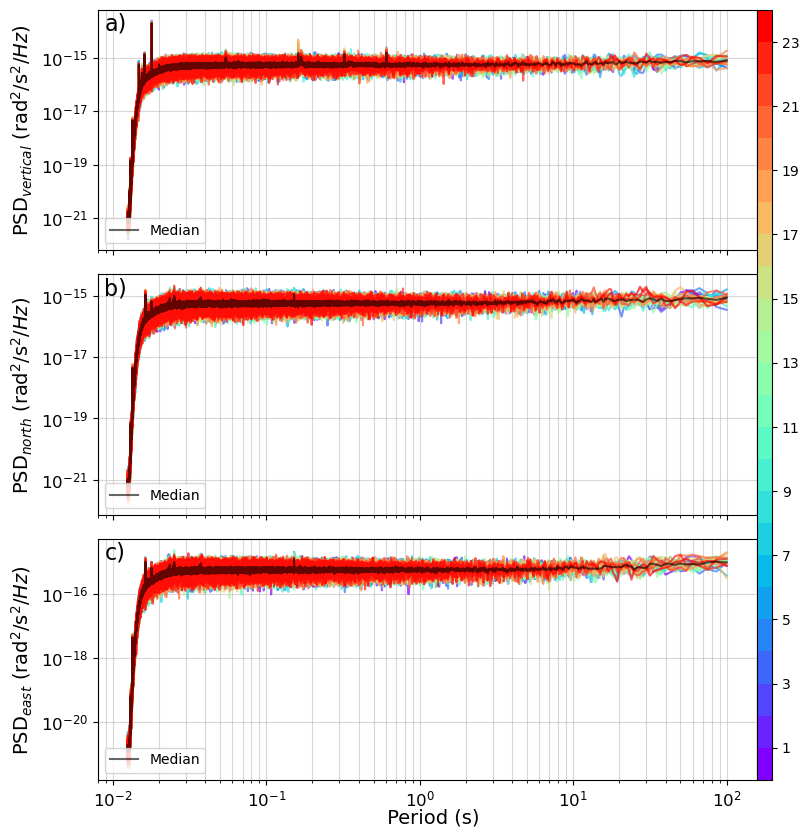


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230412.png ...

   -> Done

2023_BSPF_Z_3600_20230413_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


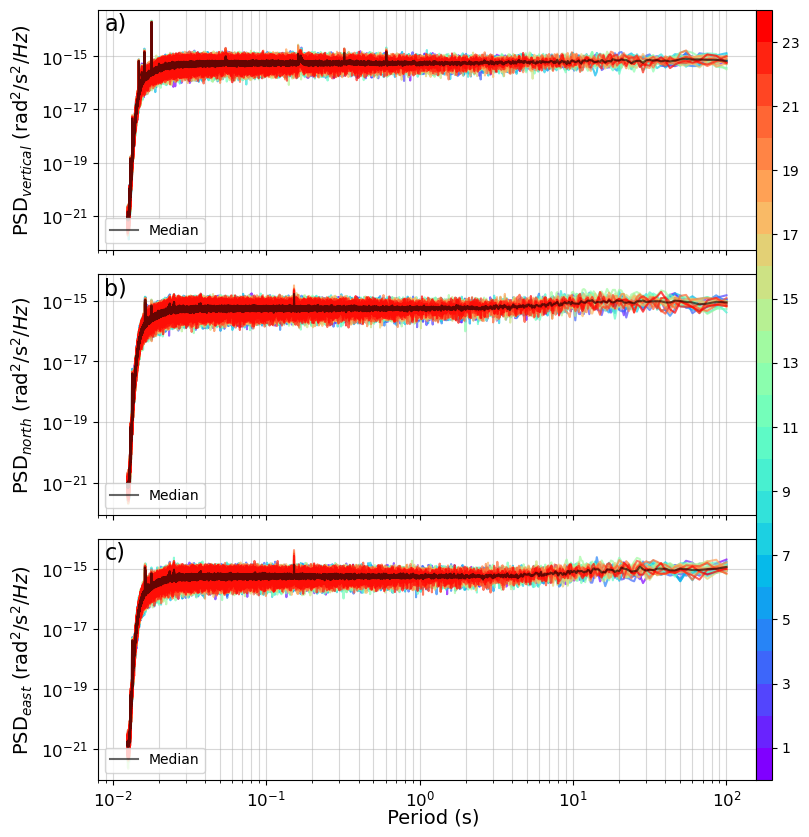


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230413.png ...

   -> Done

2023_BSPF_Z_3600_20230414_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


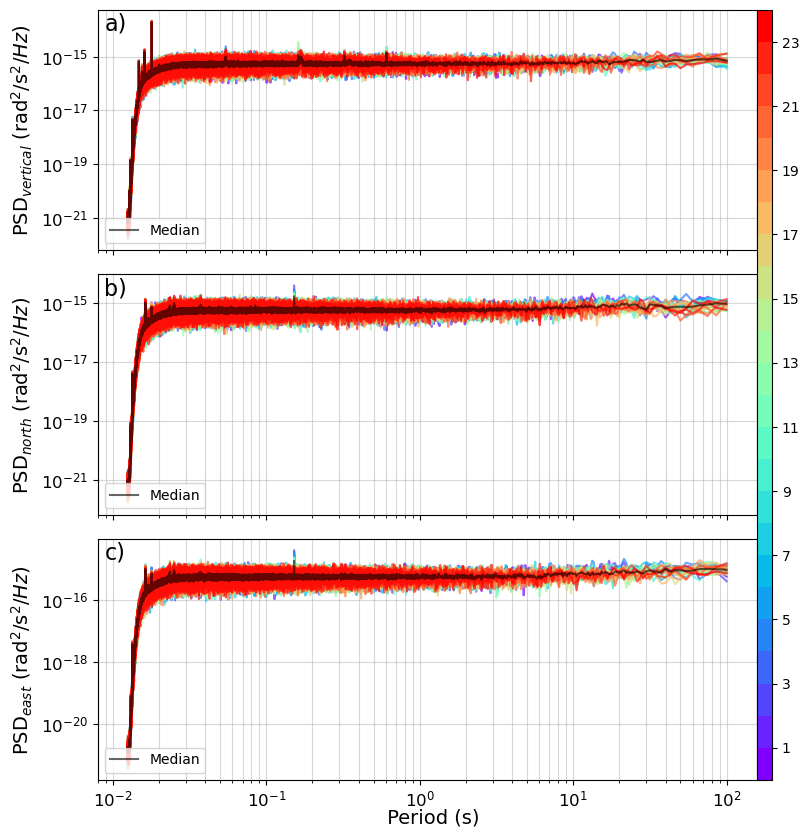


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230414.png ...

   -> Done

2023_BSPF_Z_3600_20230415_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


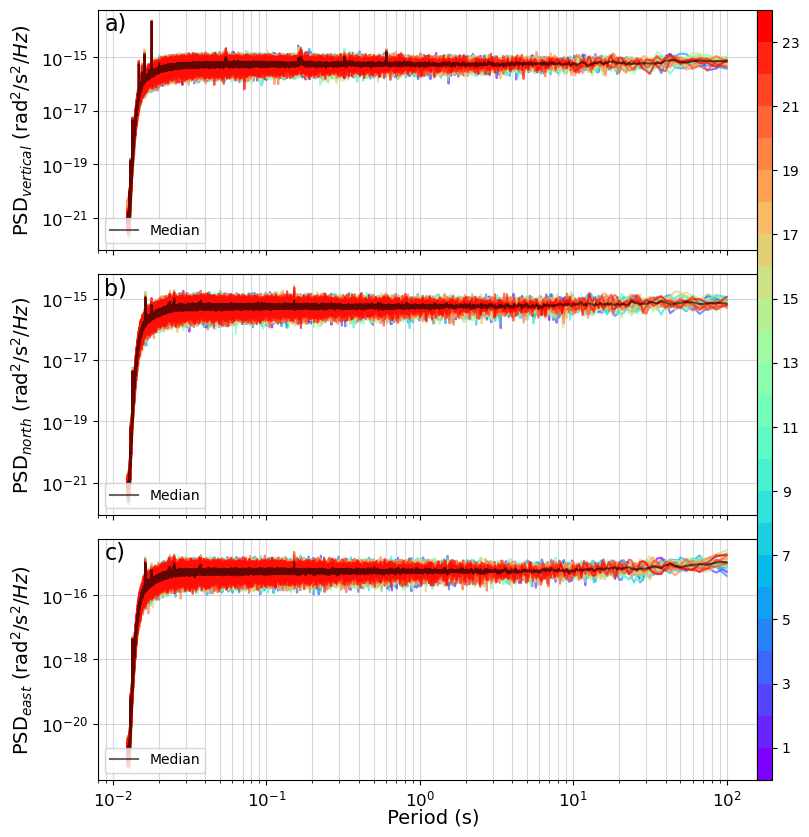


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230415.png ...

   -> Done

2023_BSPF_Z_3600_20230416_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


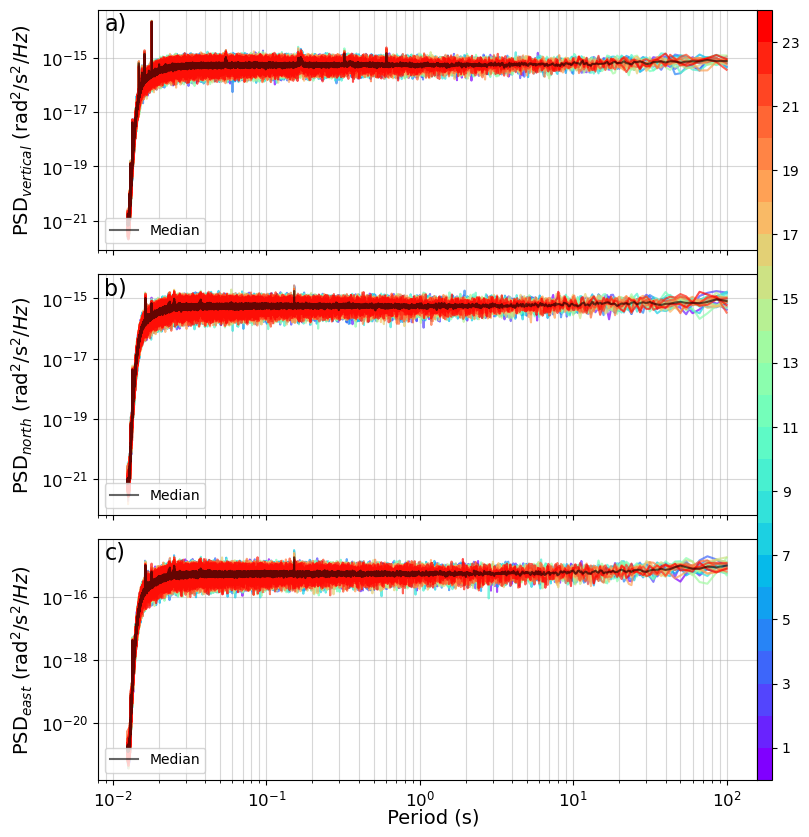


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230416.png ...

   -> Done

2023_BSPF_Z_3600_20230417_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


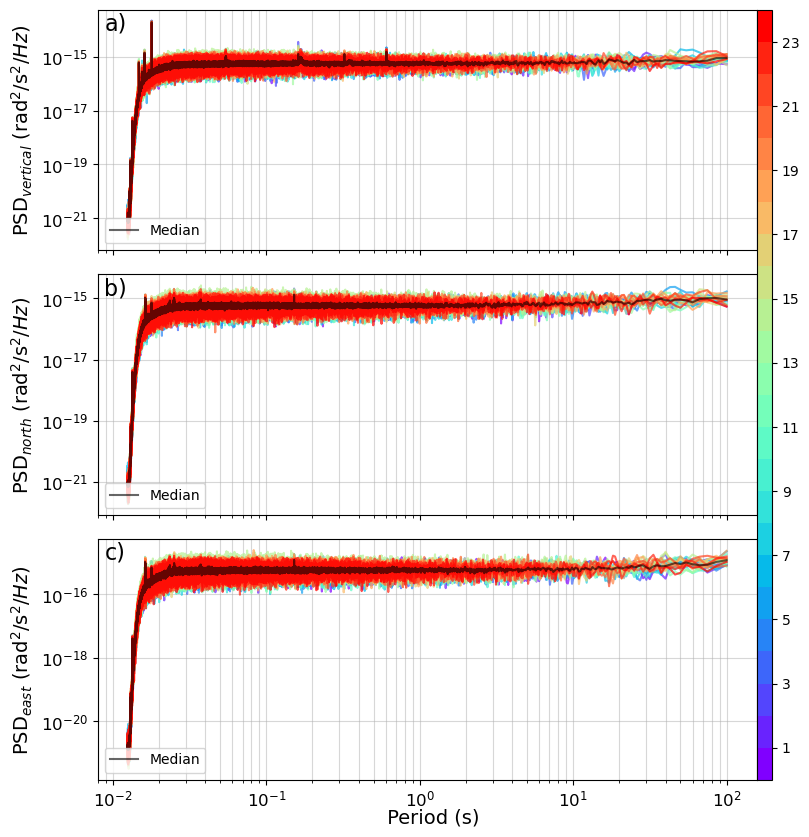


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230417.png ...

   -> Done

2023_BSPF_Z_3600_20230418_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


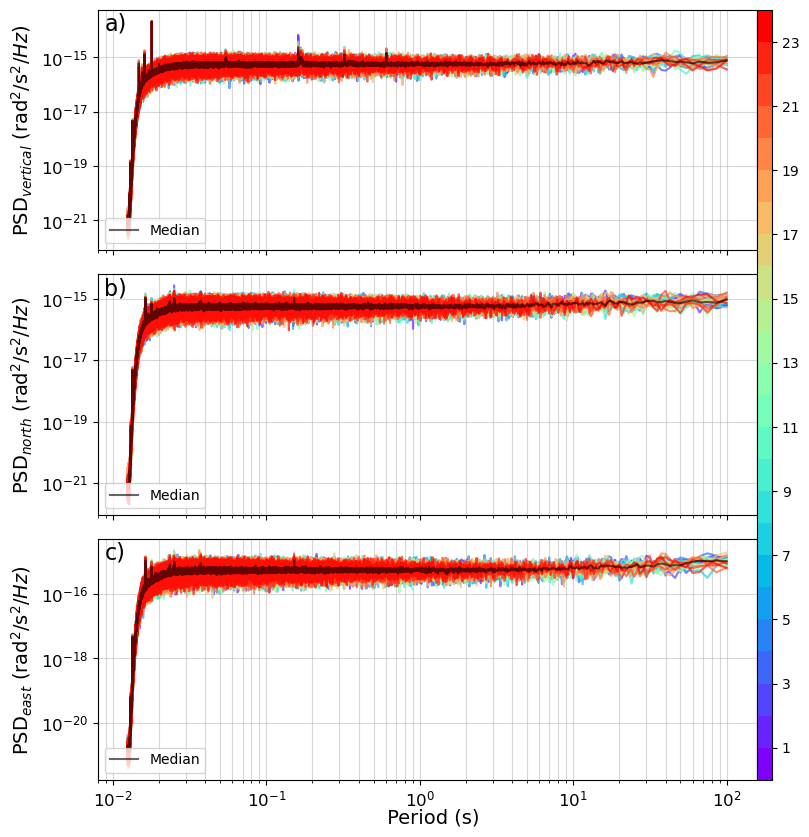


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230418.png ...

   -> Done

2023_BSPF_Z_3600_20230419_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


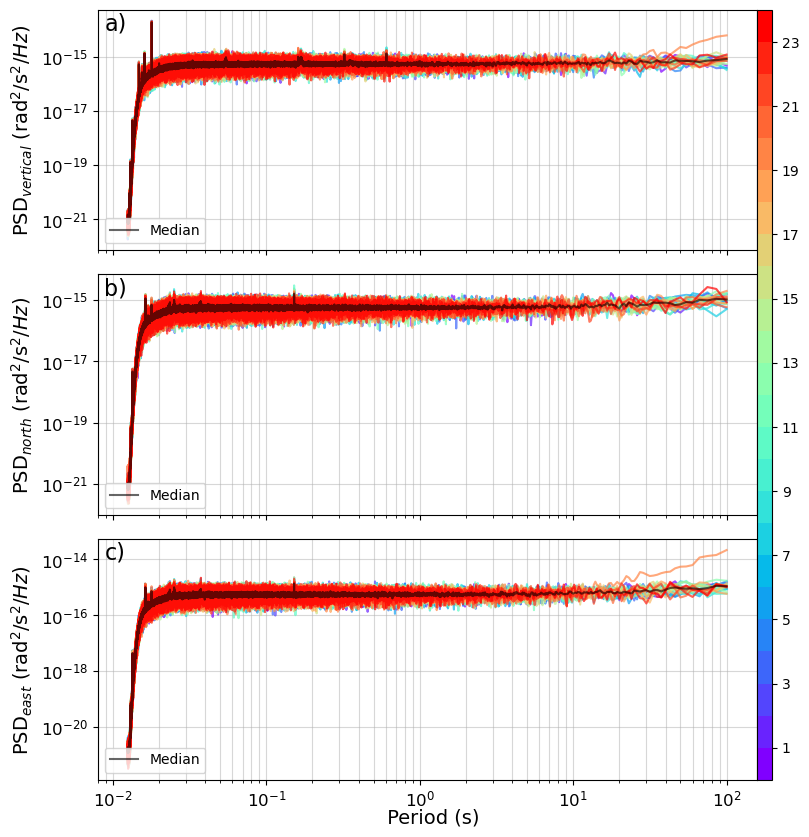


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230419.png ...

   -> Done

2023_BSPF_Z_3600_20230420_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


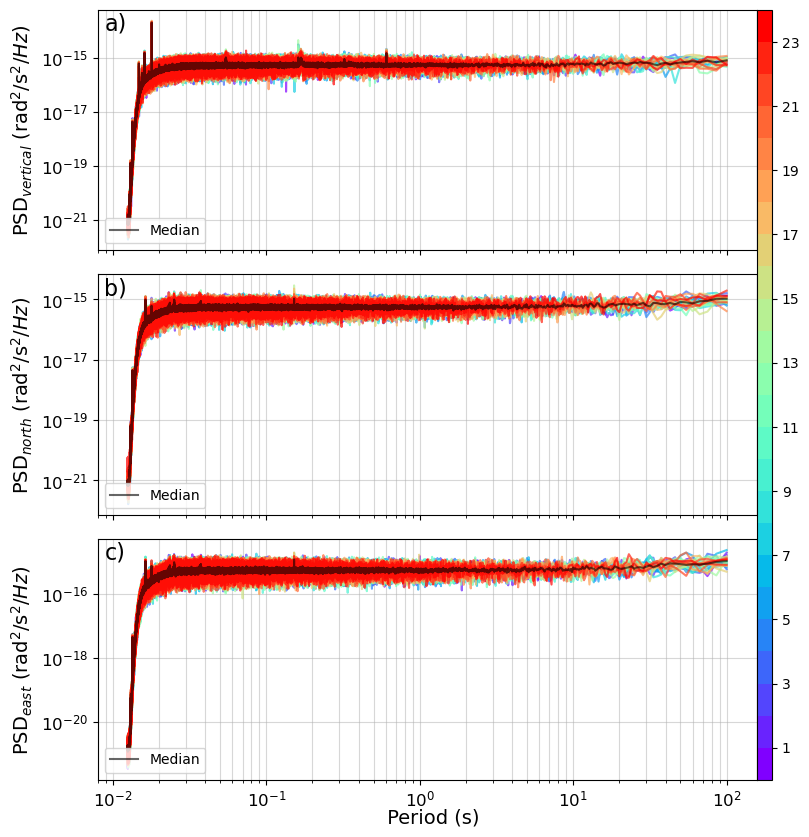


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230420.png ...

   -> Done

2023_BSPF_Z_3600_20230421_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


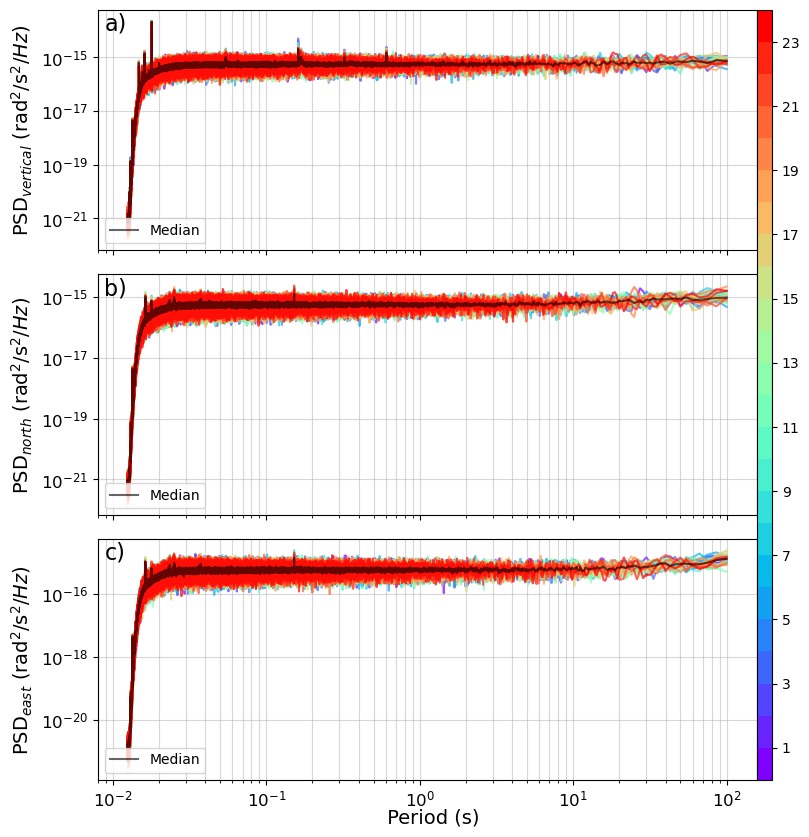


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230421.png ...

   -> Done

2023_BSPF_Z_3600_20230422_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


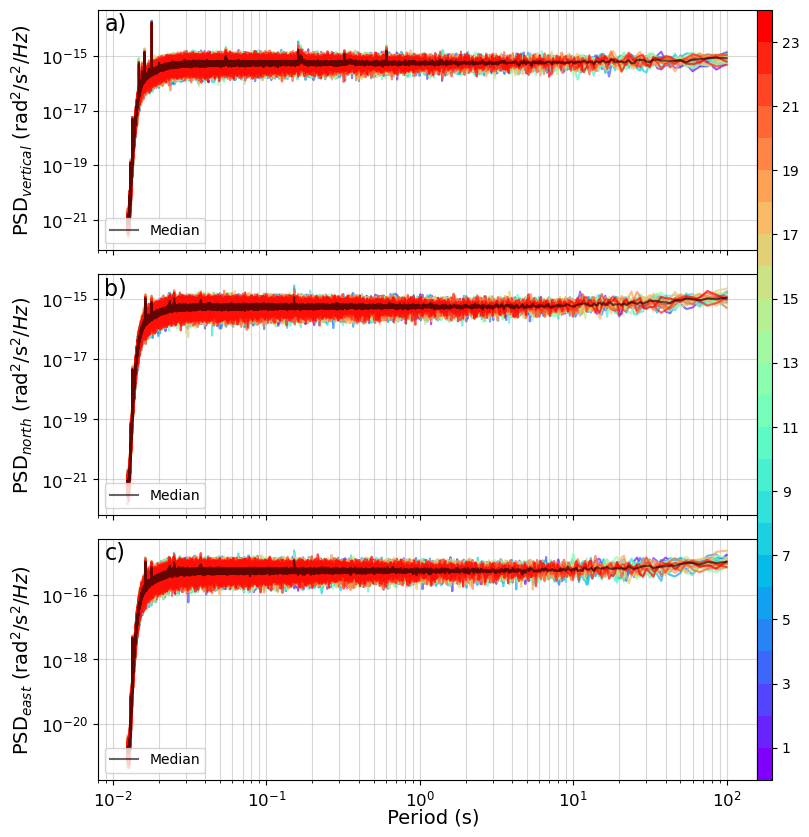


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230422.png ...

   -> Done

2023_BSPF_Z_3600_20230423_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


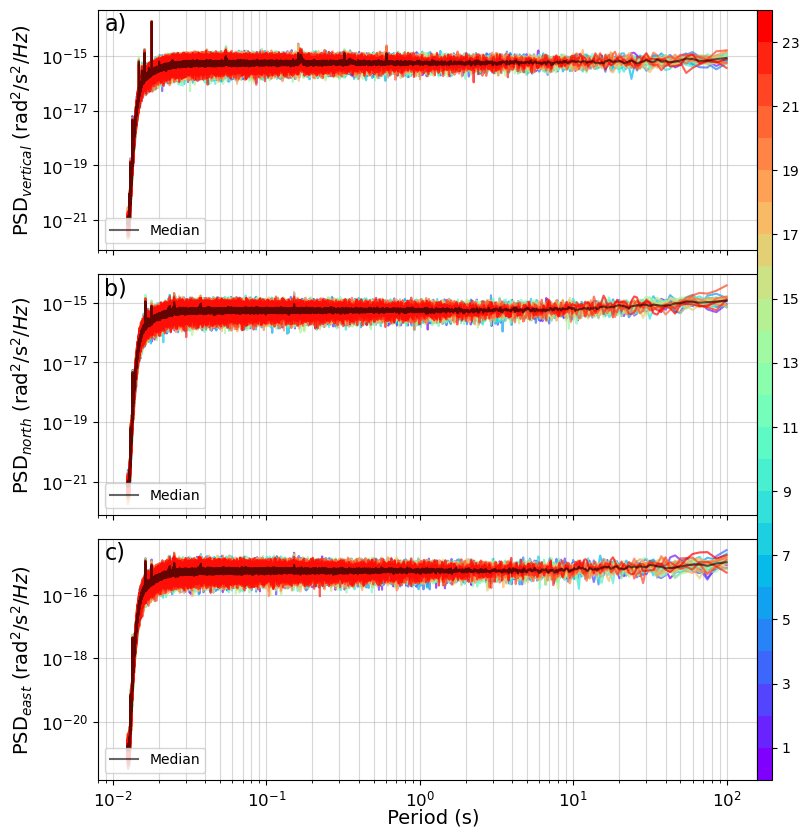


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230423.png ...

   -> Done

2023_BSPF_Z_3600_20230424_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


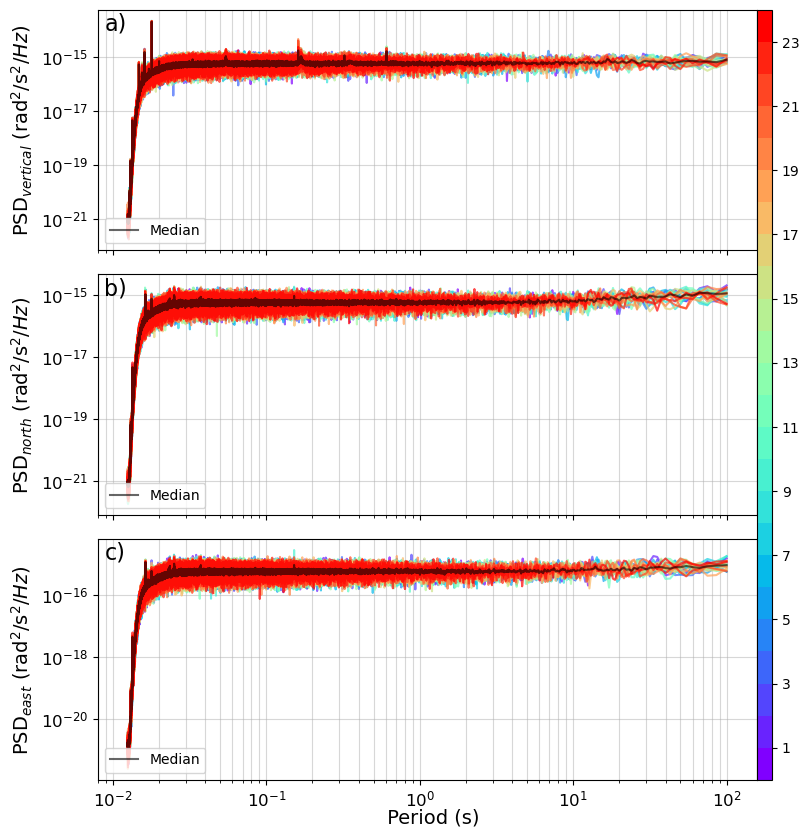


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230424.png ...

   -> Done

2023_BSPF_Z_3600_20230425_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


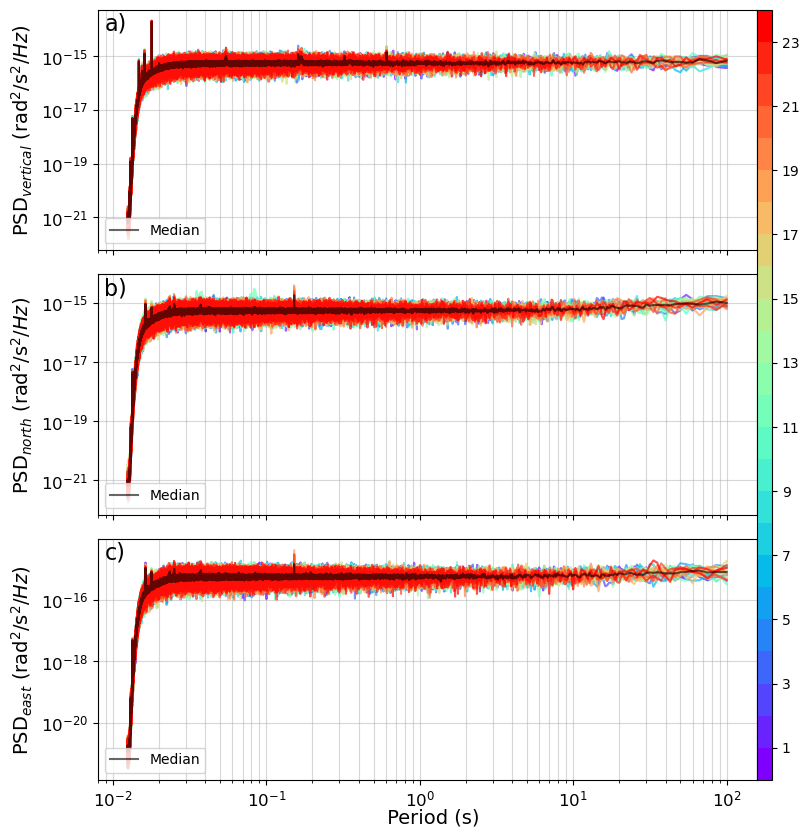


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230425.png ...

   -> Done

2023_BSPF_Z_3600_20230426_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


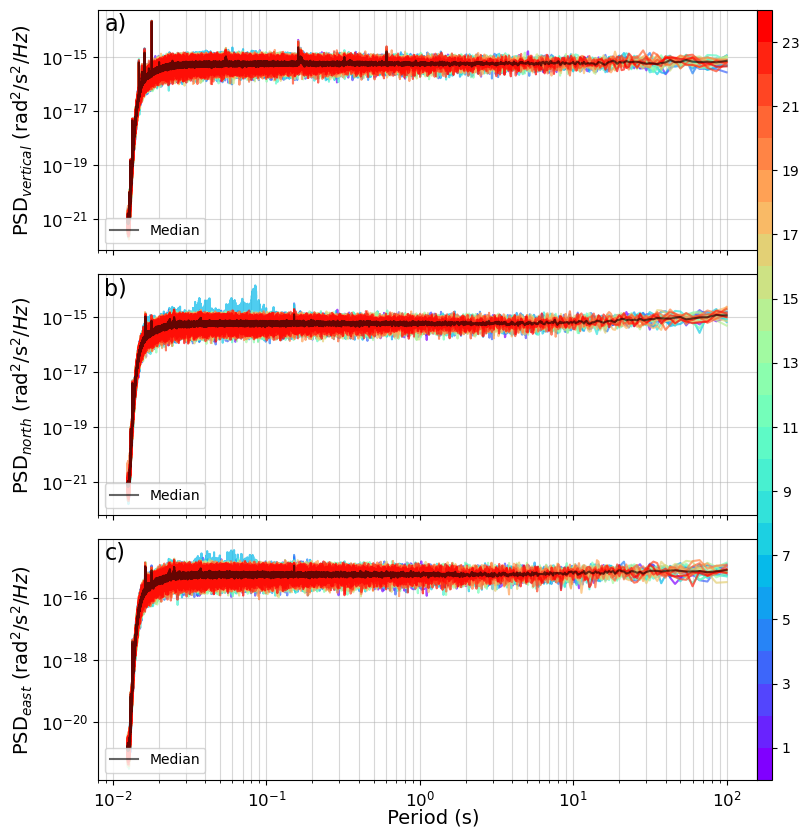


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230426.png ...

   -> Done

2023_BSPF_Z_3600_20230427_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


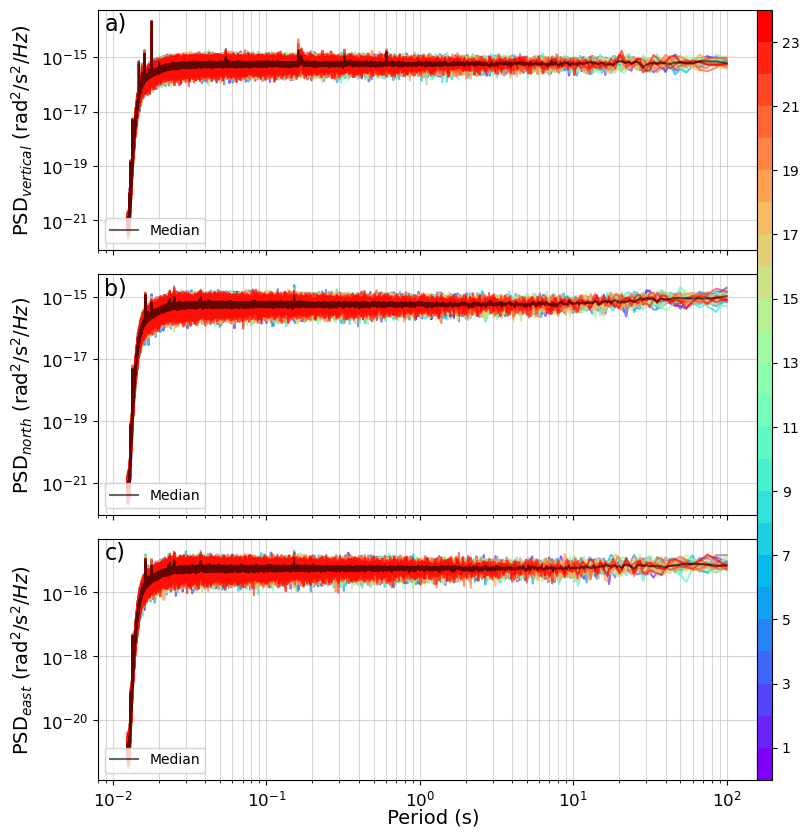


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230427.png ...

   -> Done

2023_BSPF_Z_3600_20230428_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


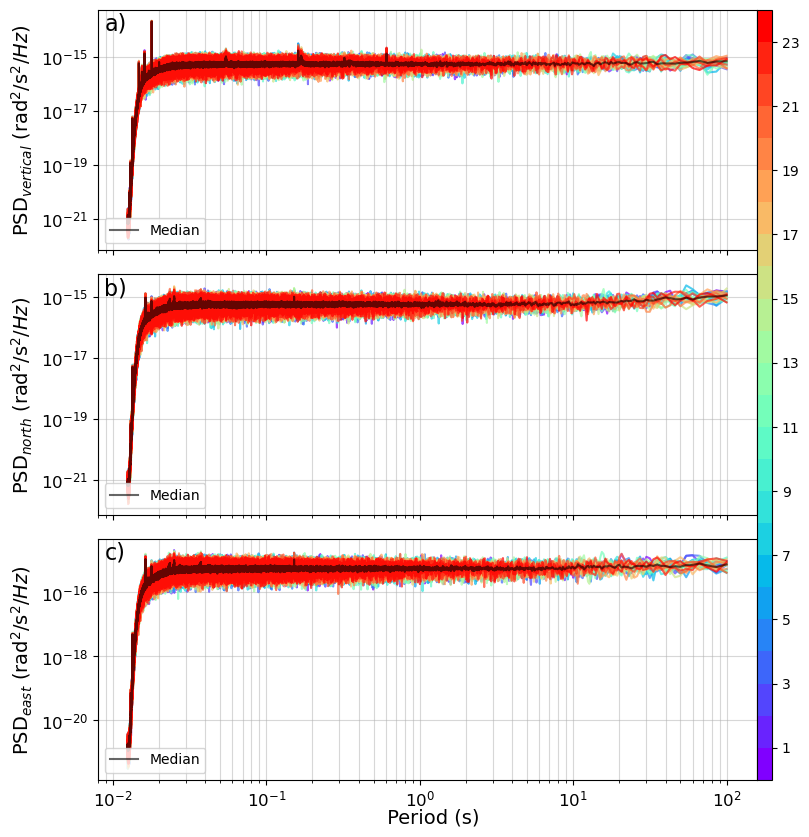


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230428.png ...

   -> Done

2023_BSPF_Z_3600_20230429_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


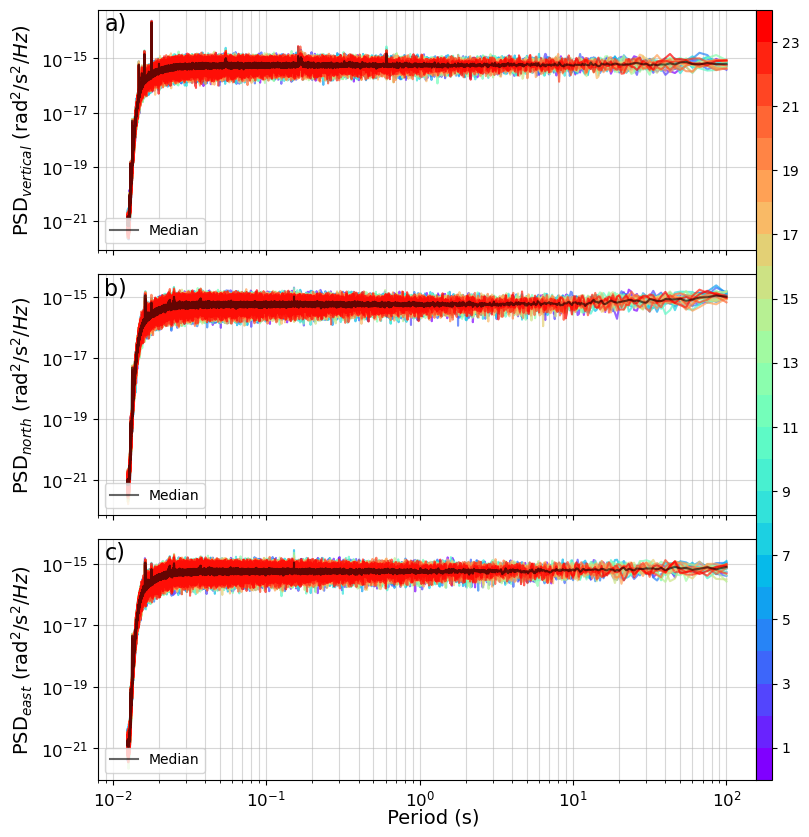


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230429.png ...

   -> Done

2023_BSPF_Z_3600_20230430_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


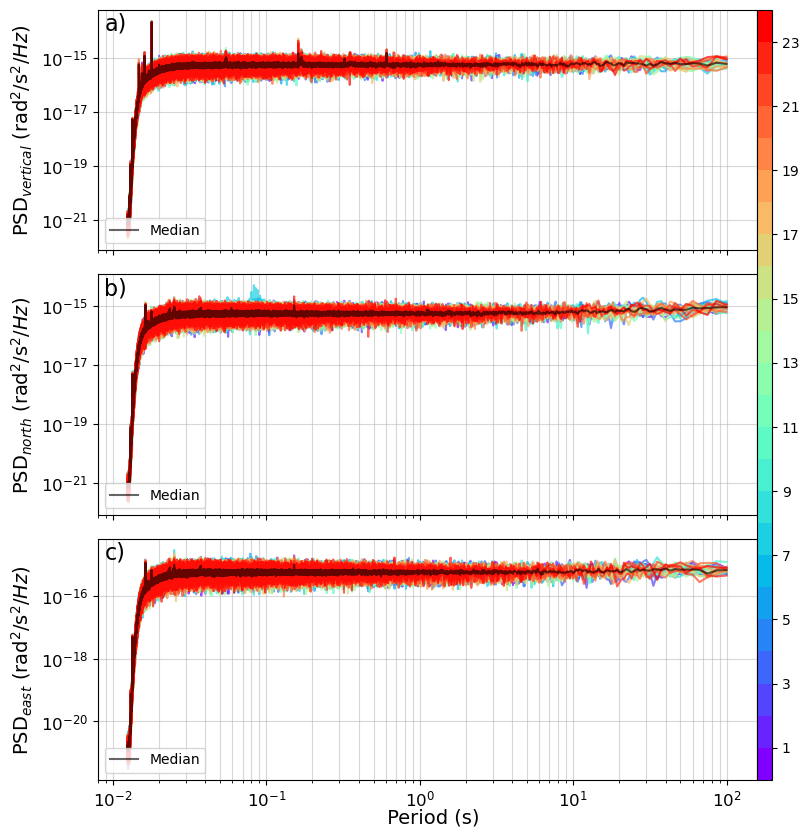


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230430.png ...

   -> Done

2023_BSPF_Z_3600_20230501_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


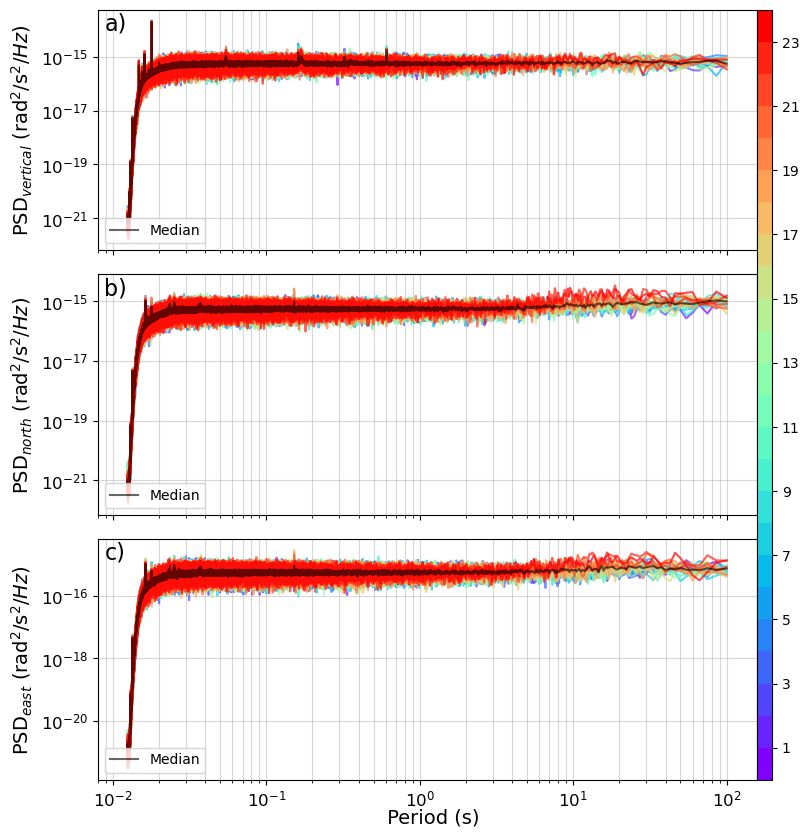


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230501.png ...

   -> Done

2023_BSPF_Z_3600_20230502_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


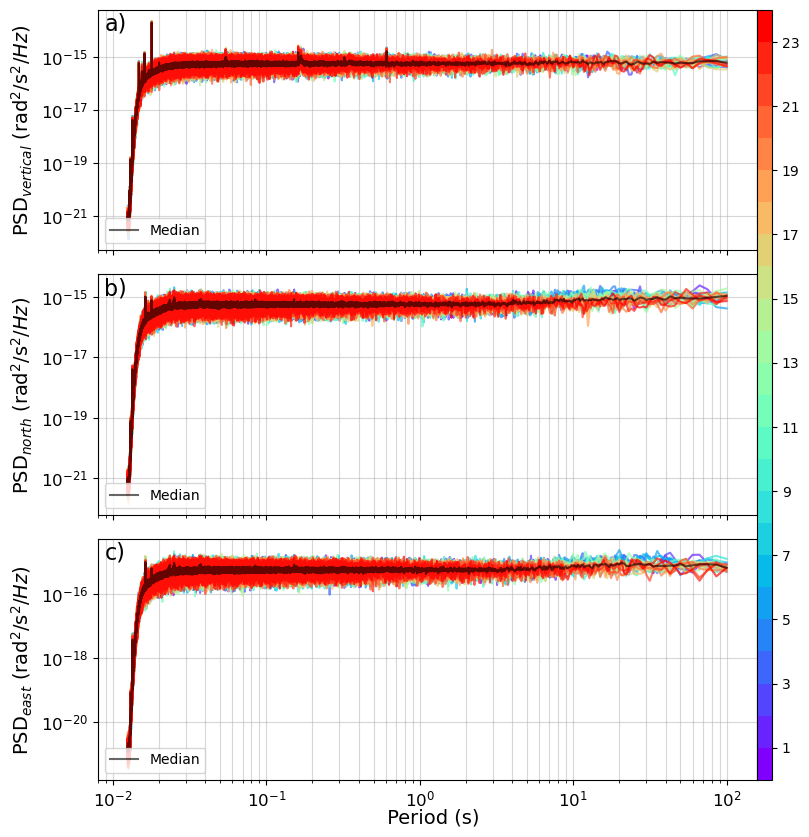


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230502.png ...

   -> Done

2023_BSPF_Z_3600_20230503_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


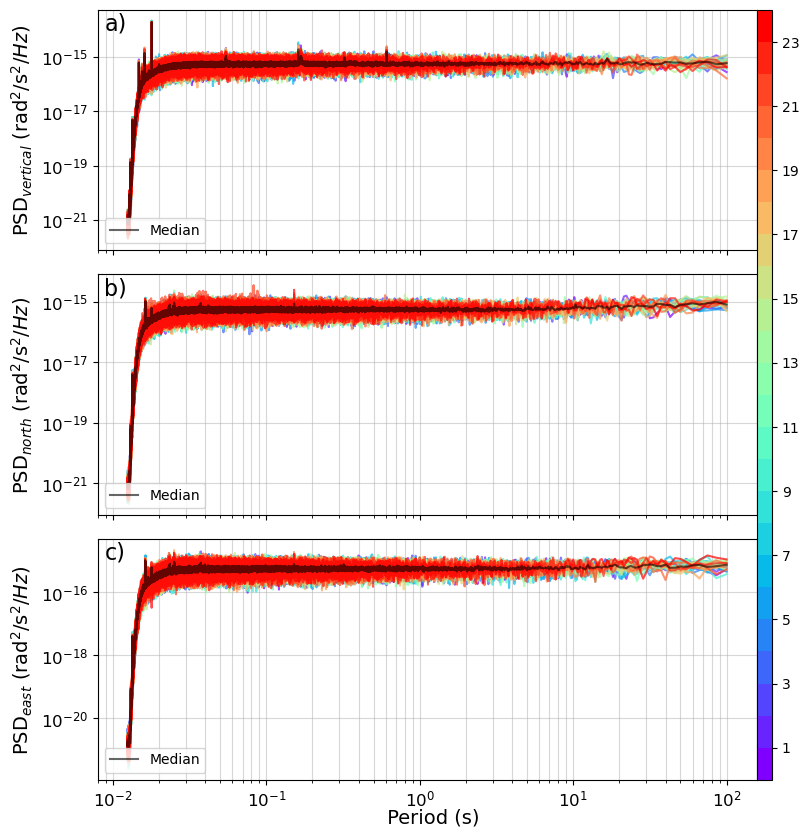


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230503.png ...

   -> Done

2023_BSPF_Z_3600_20230504_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


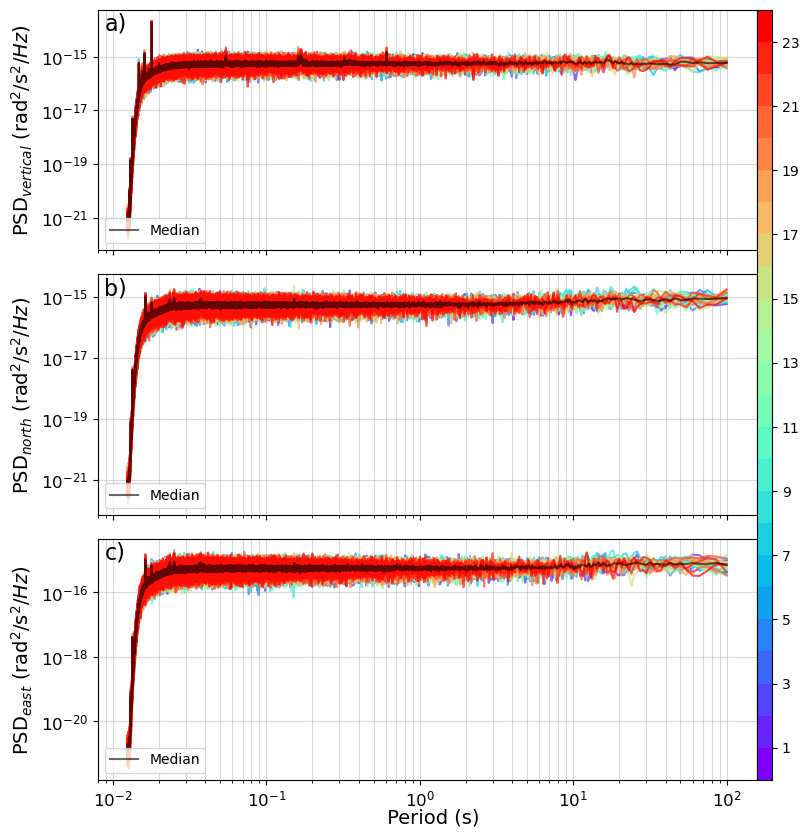


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230504.png ...

   -> Done

2023_BSPF_Z_3600_20230505_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


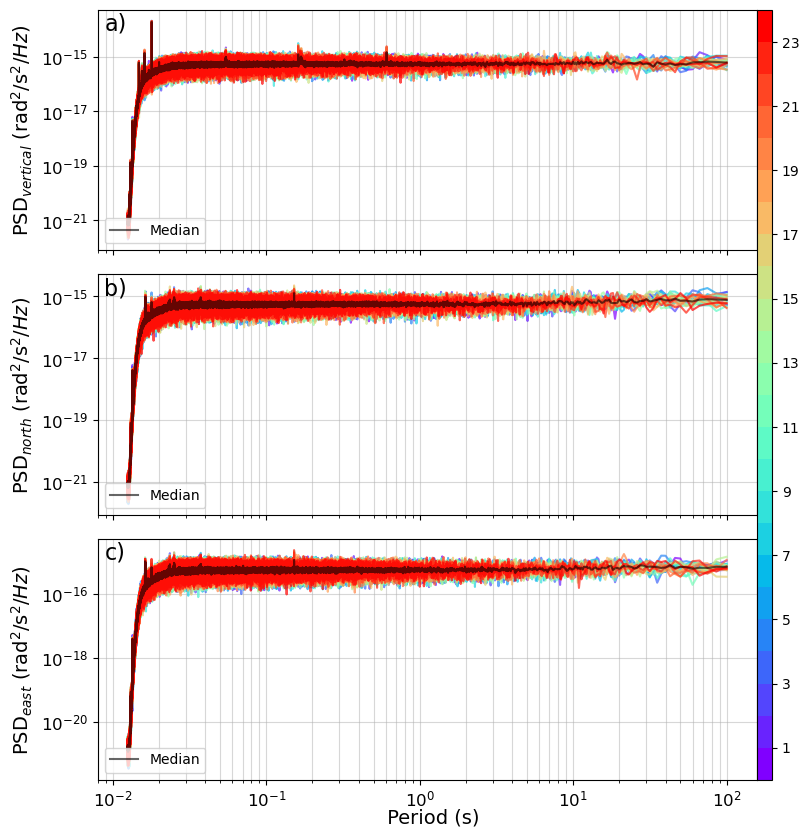


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230505.png ...

   -> Done

2023_BSPF_Z_3600_20230506_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


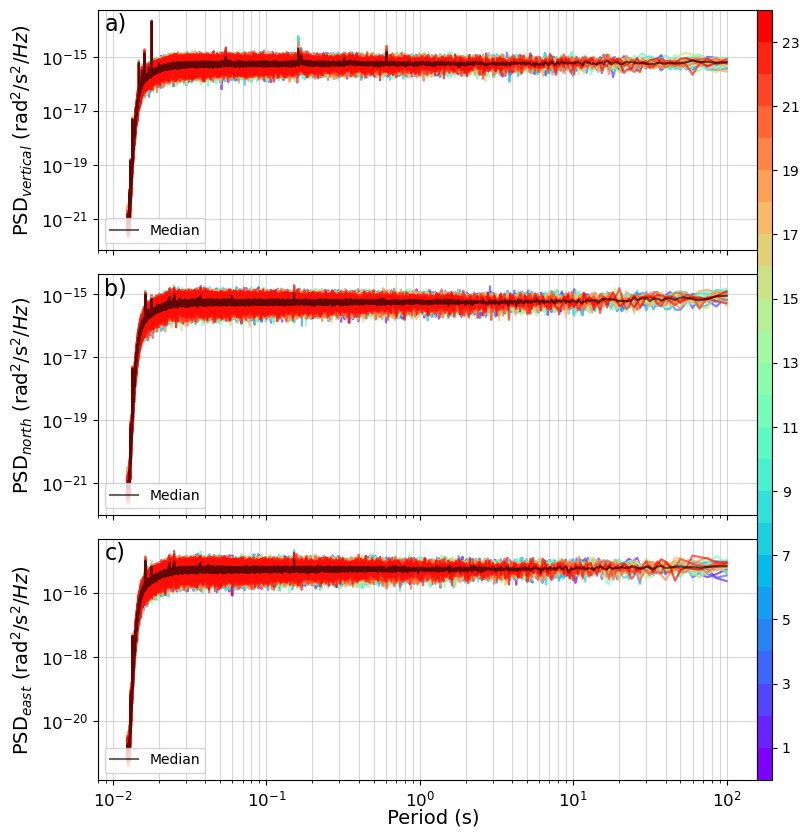


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230506.png ...

   -> Done

2023_BSPF_Z_3600_20230507_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


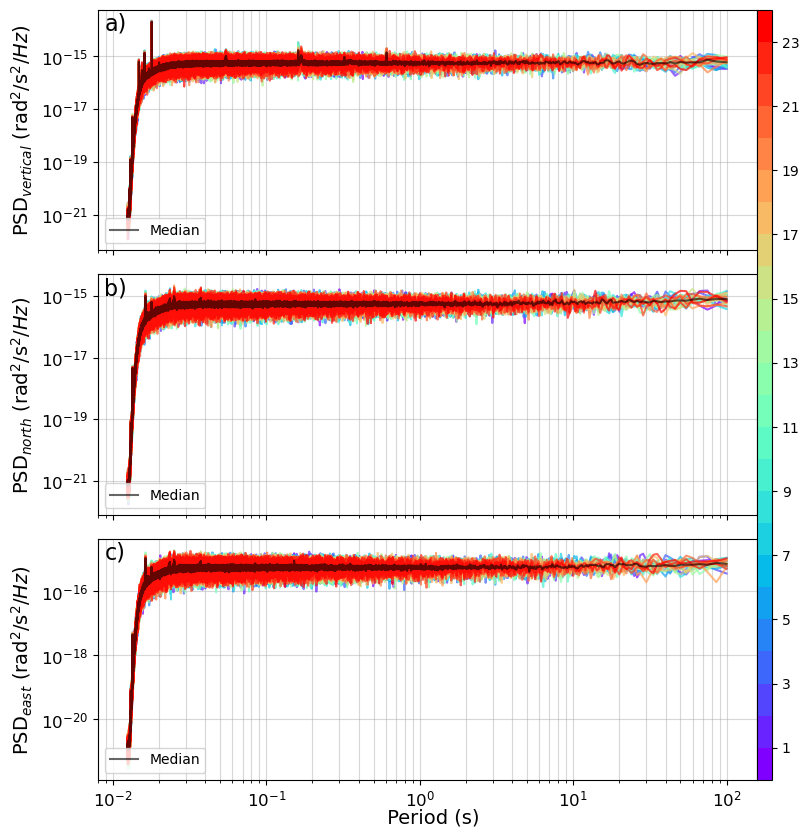


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230507.png ...

   -> Done

2023_BSPF_Z_3600_20230508_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


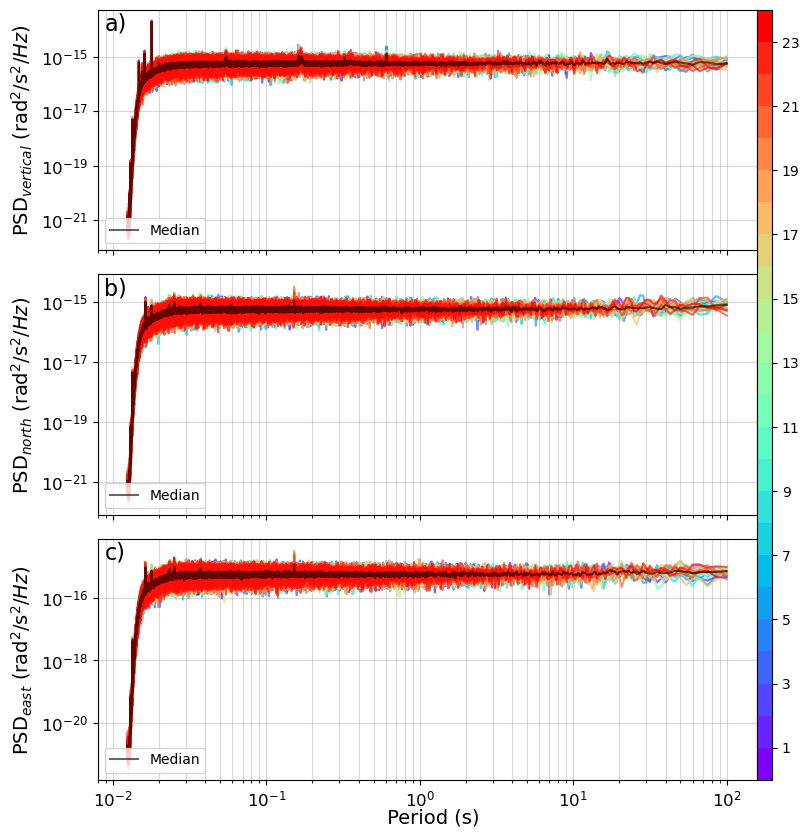


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230508.png ...

   -> Done

2023_BSPF_Z_3600_20230509_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


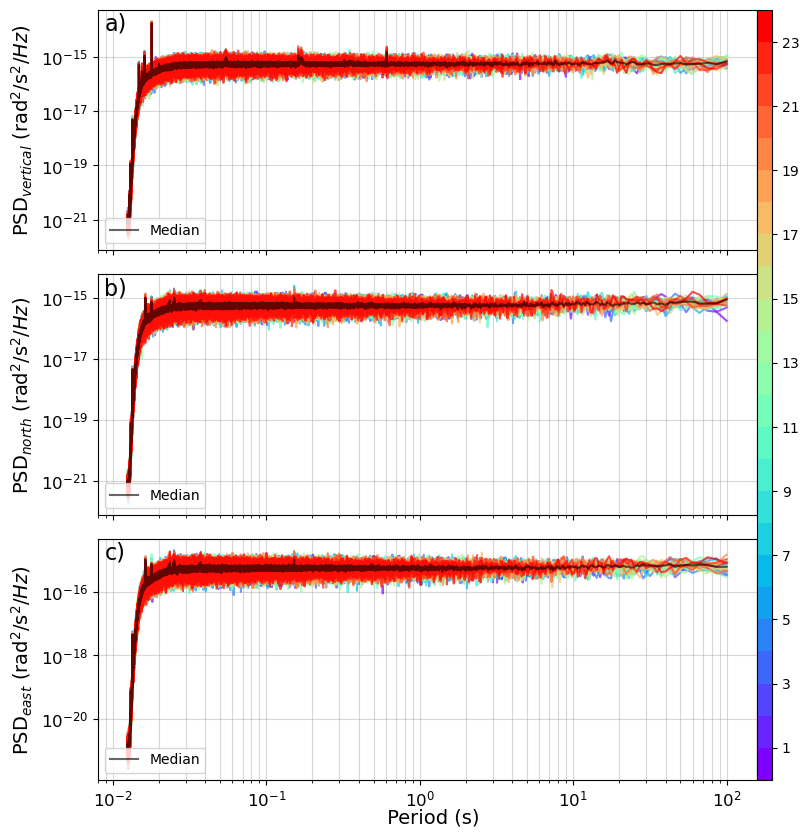


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230509.png ...

   -> Done

2023_BSPF_Z_3600_20230510_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


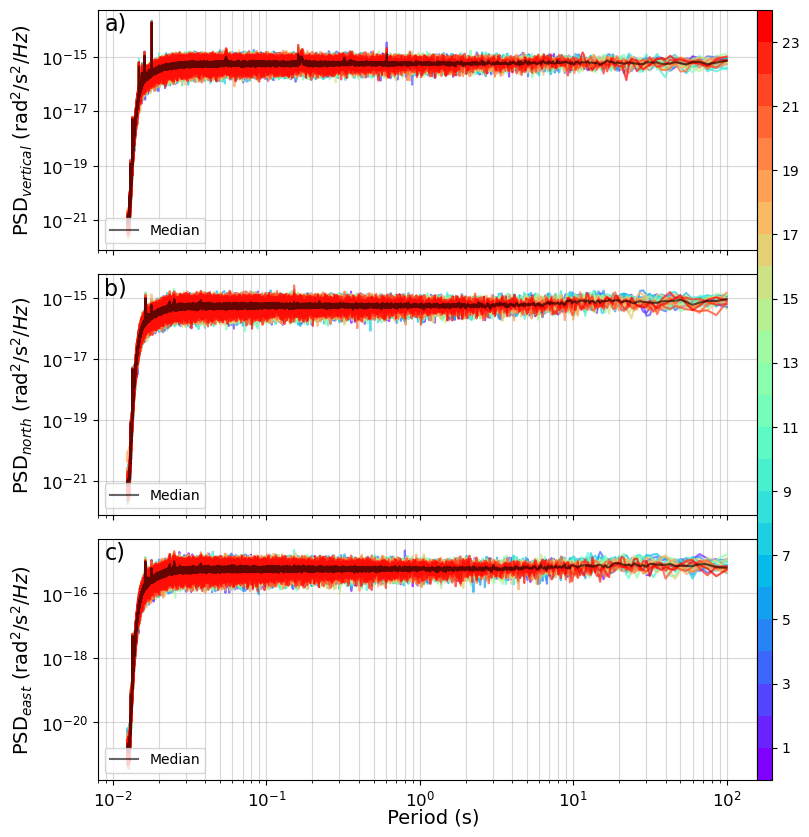


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230510.png ...

   -> Done

2023_BSPF_Z_3600_20230511_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


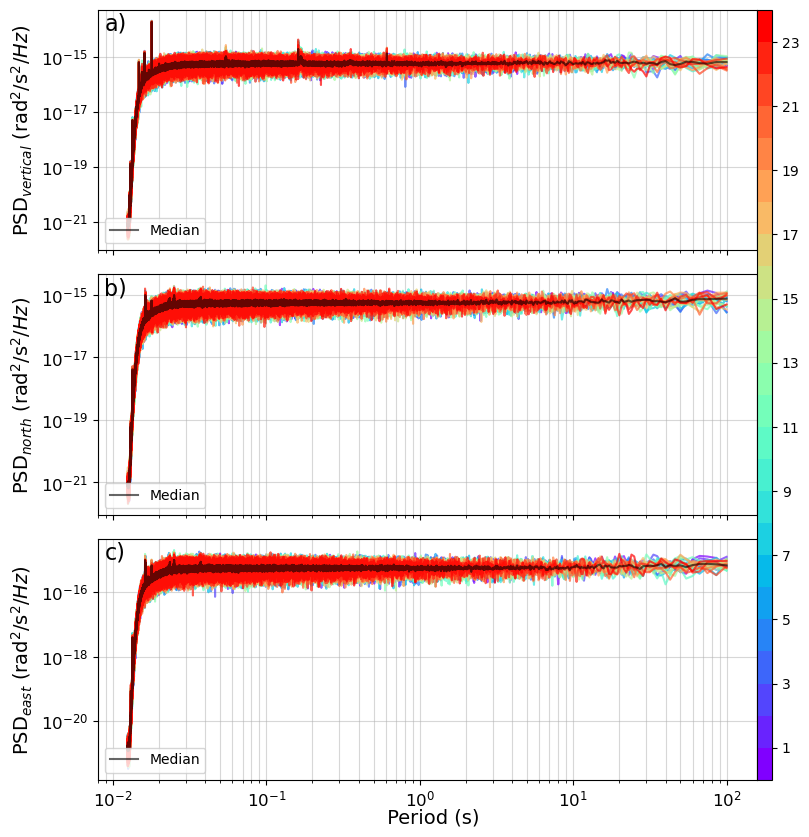


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230511.png ...

   -> Done

2023_BSPF_Z_3600_20230512_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


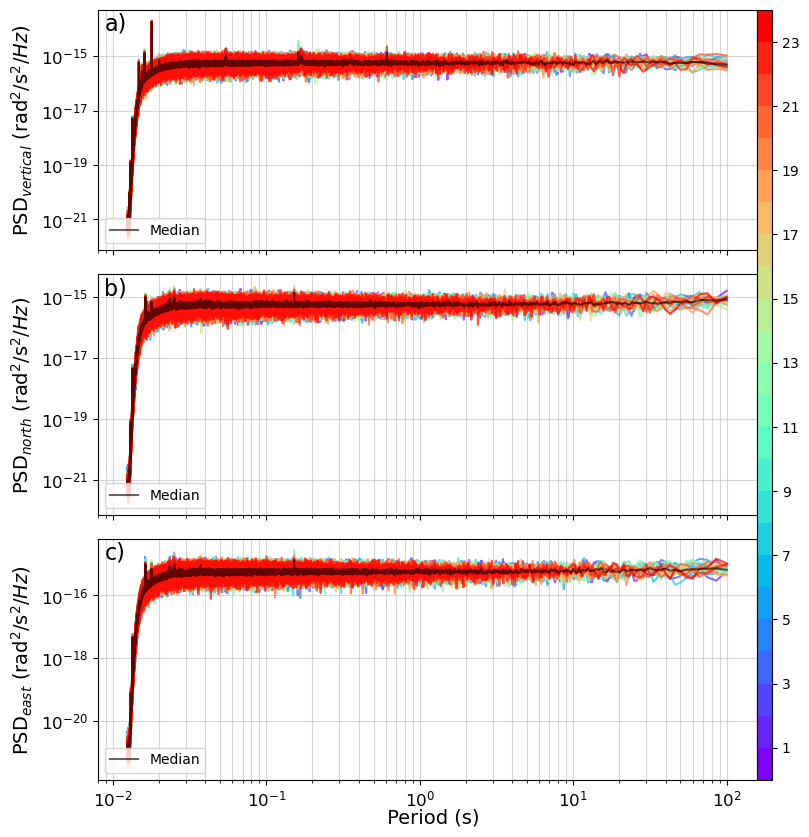


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230512.png ...

   -> Done

2023_BSPF_Z_3600_20230513_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


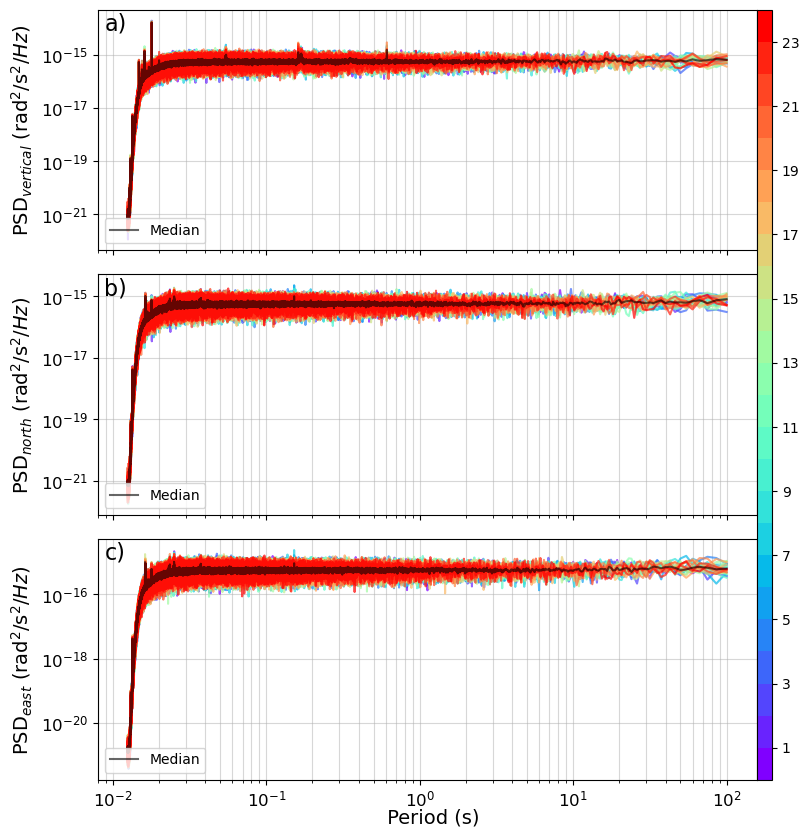


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230513.png ...

   -> Done

2023_BSPF_Z_3600_20230514_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


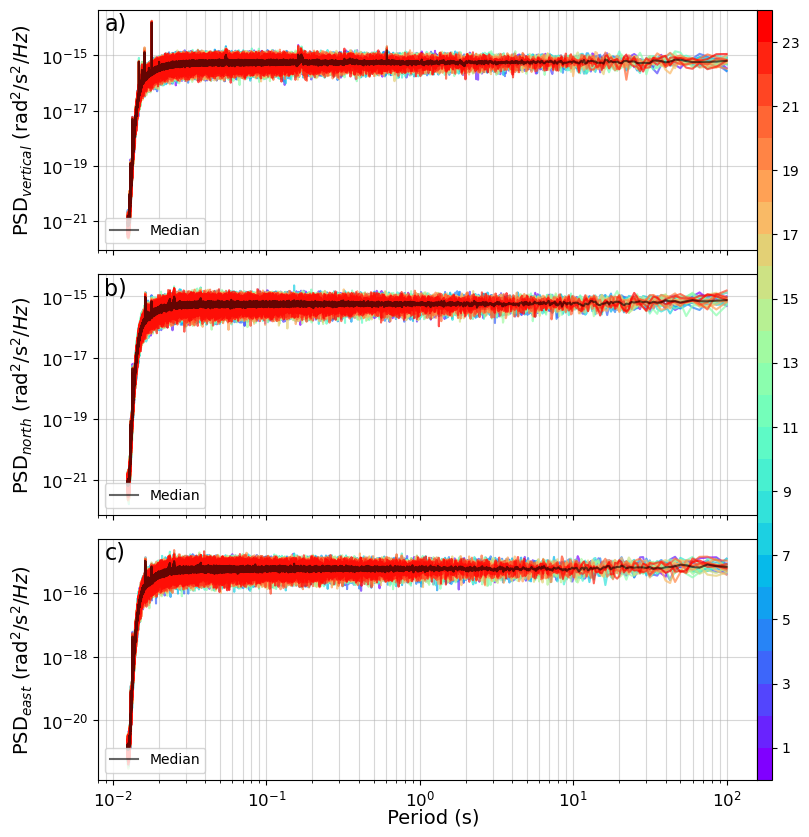


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230514.png ...

   -> Done

2023_BSPF_Z_3600_20230515_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


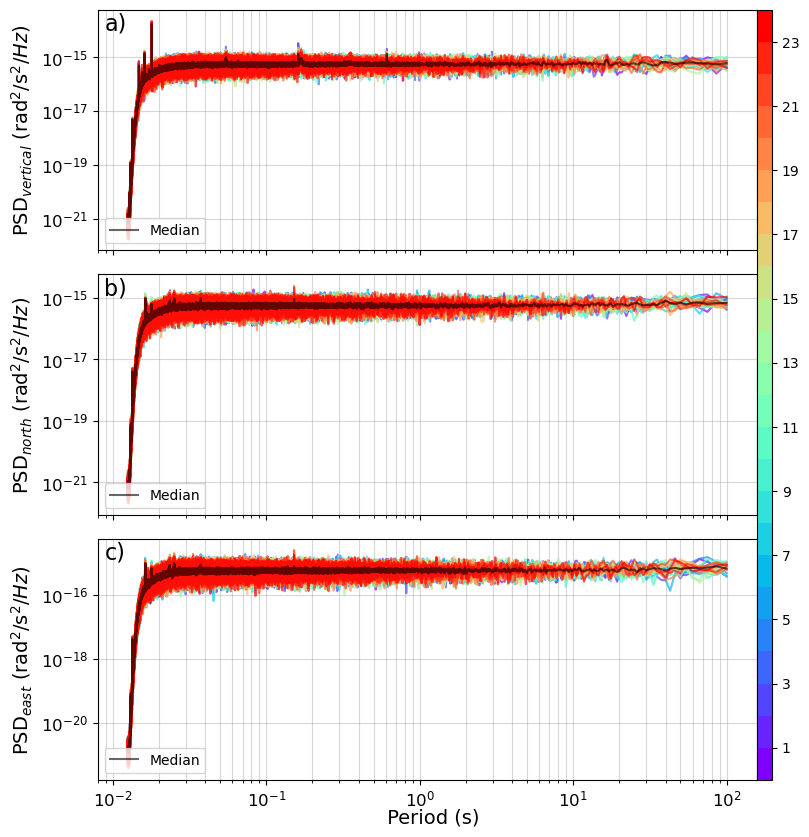


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230515.png ...

   -> Done

2023_BSPF_Z_3600_20230516_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


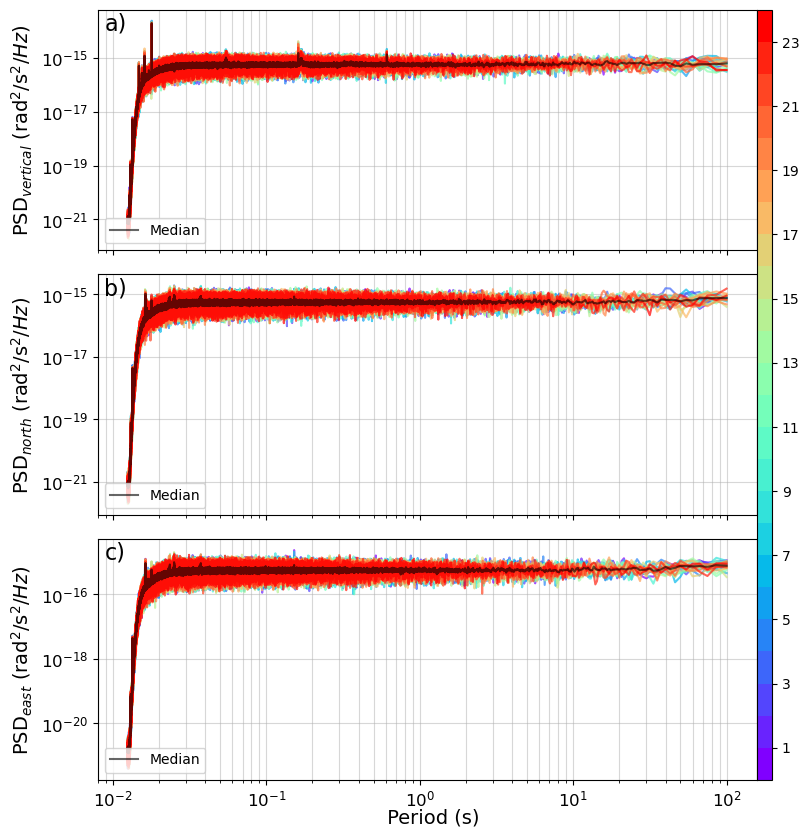


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230516.png ...

   -> Done

2023_BSPF_Z_3600_20230517_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


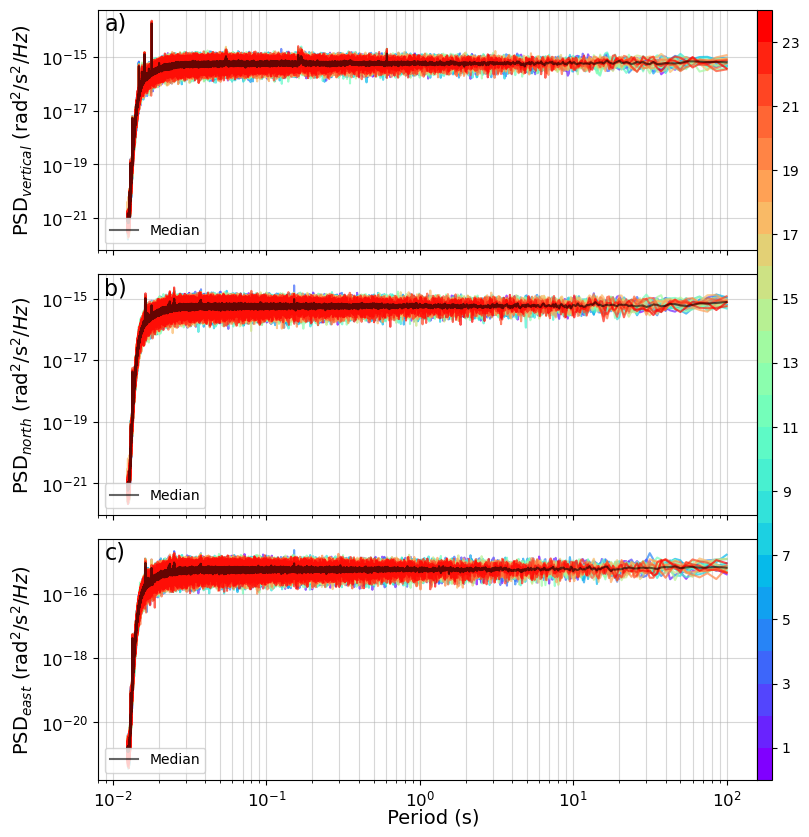


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230517.png ...

   -> Done

2023_BSPF_Z_3600_20230518_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


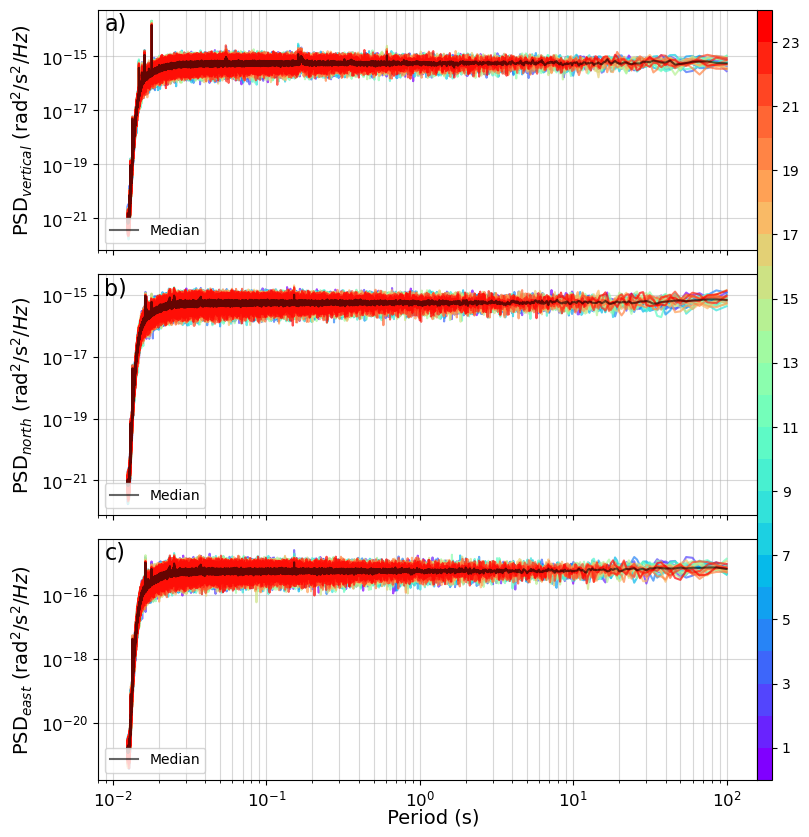


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230518.png ...

   -> Done

2023_BSPF_Z_3600_20230519_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


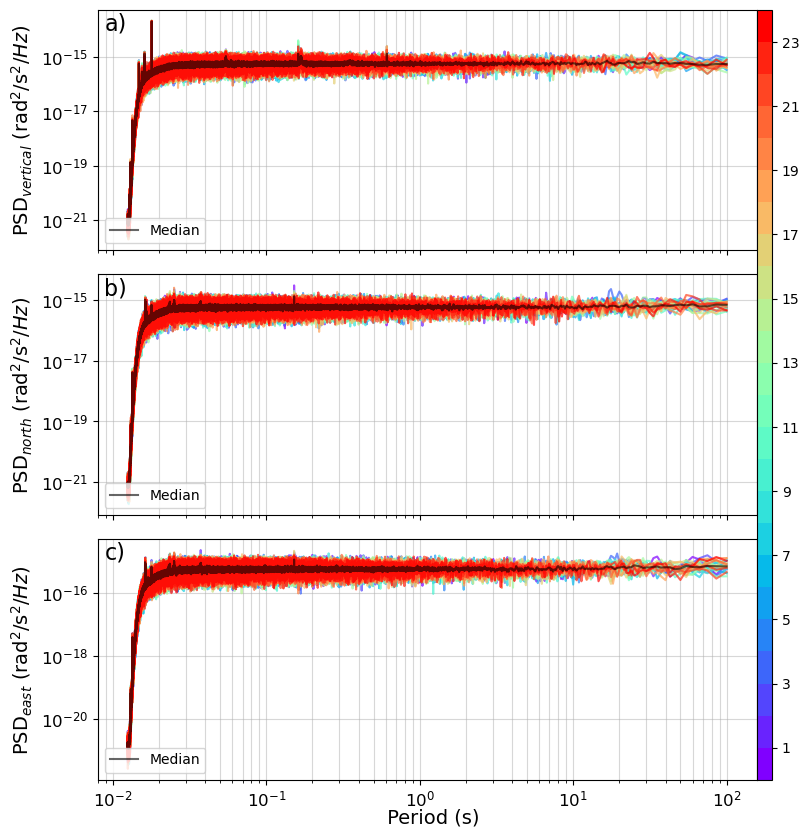


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230519.png ...

   -> Done

2023_BSPF_Z_3600_20230520_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


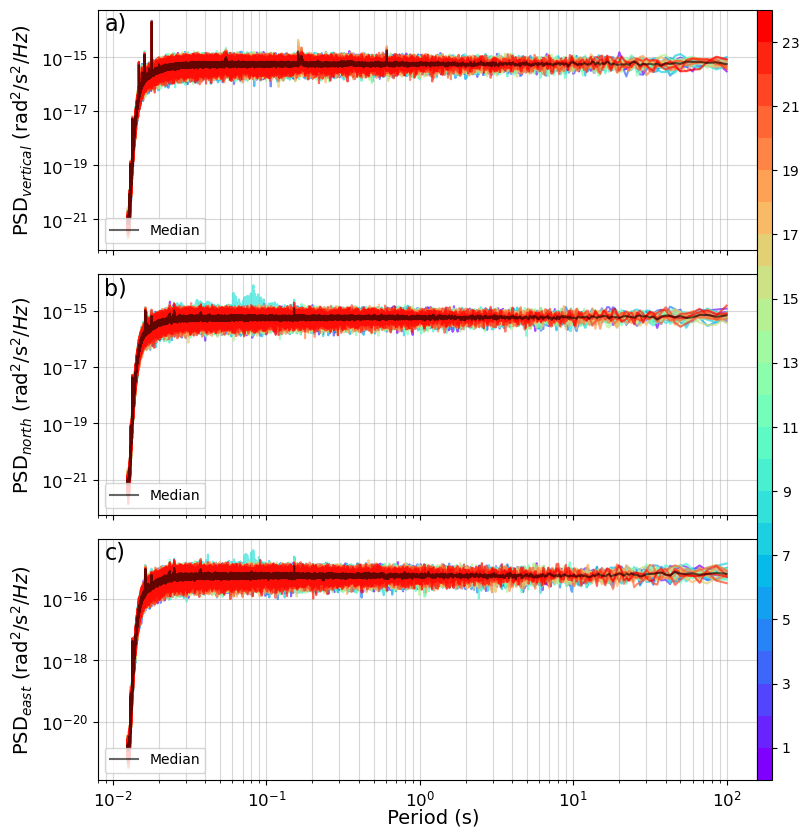


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230520.png ...

   -> Done

2023_BSPF_Z_3600_20230521_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


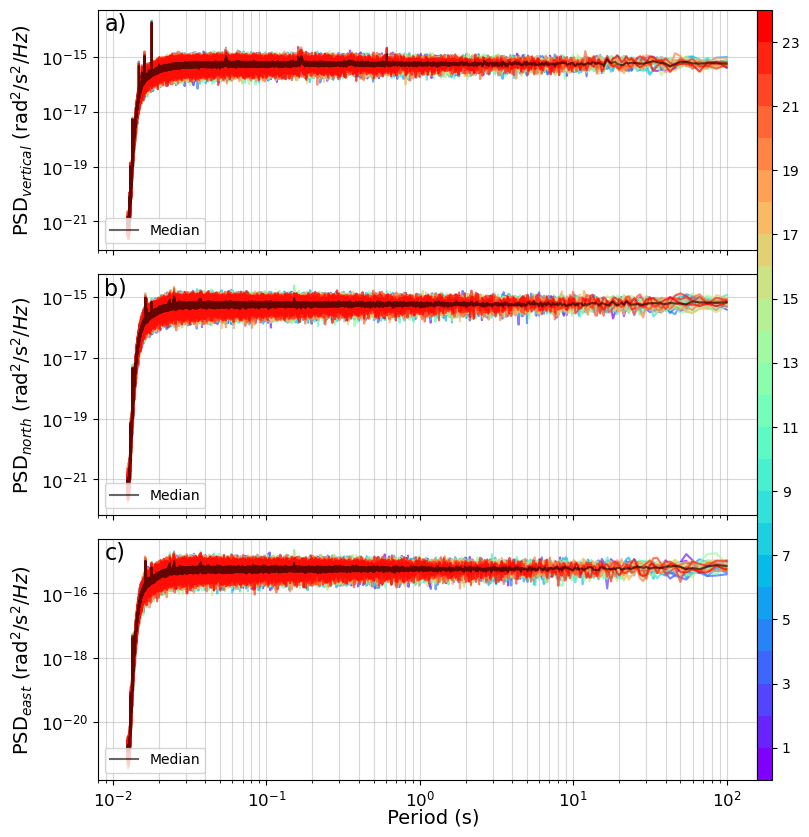


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230521.png ...

   -> Done

2023_BSPF_Z_3600_20230522_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


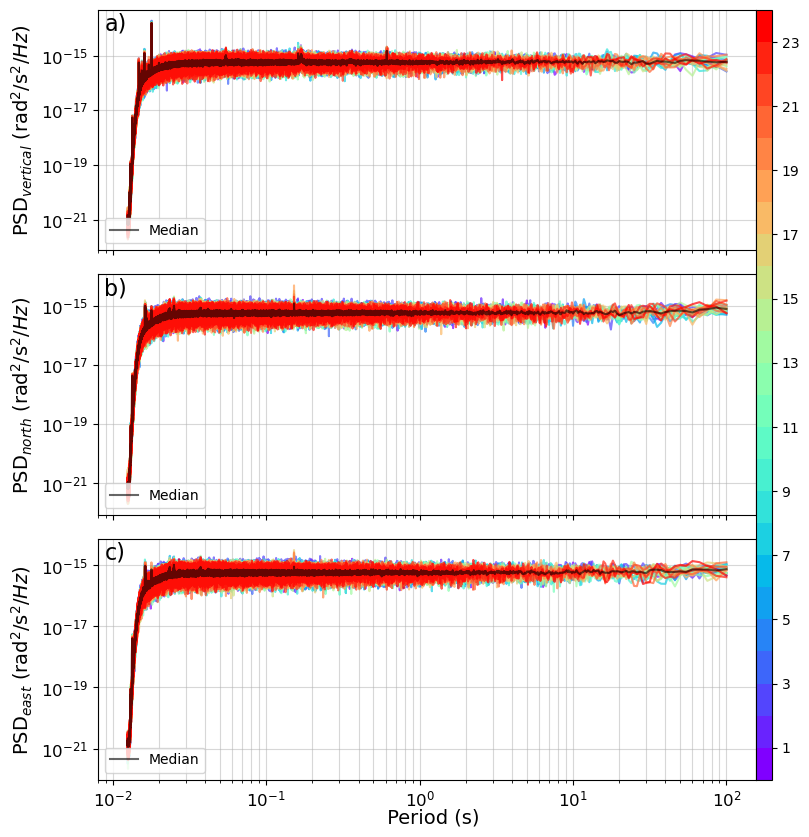


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230522.png ...

   -> Done

2023_BSPF_Z_3600_20230523_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


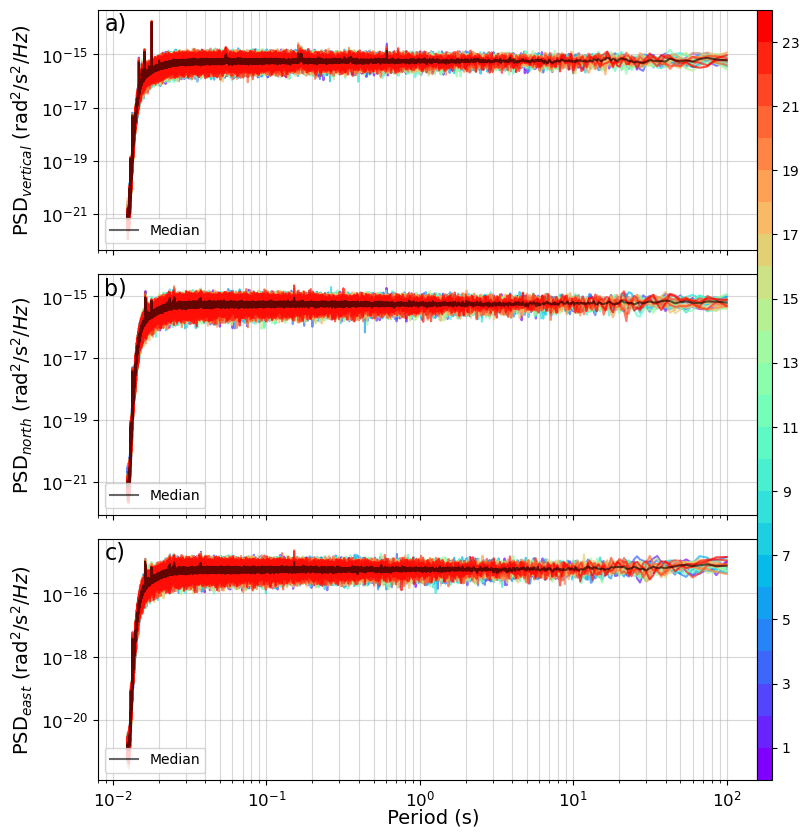


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230523.png ...

   -> Done

2023_BSPF_Z_3600_20230524_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


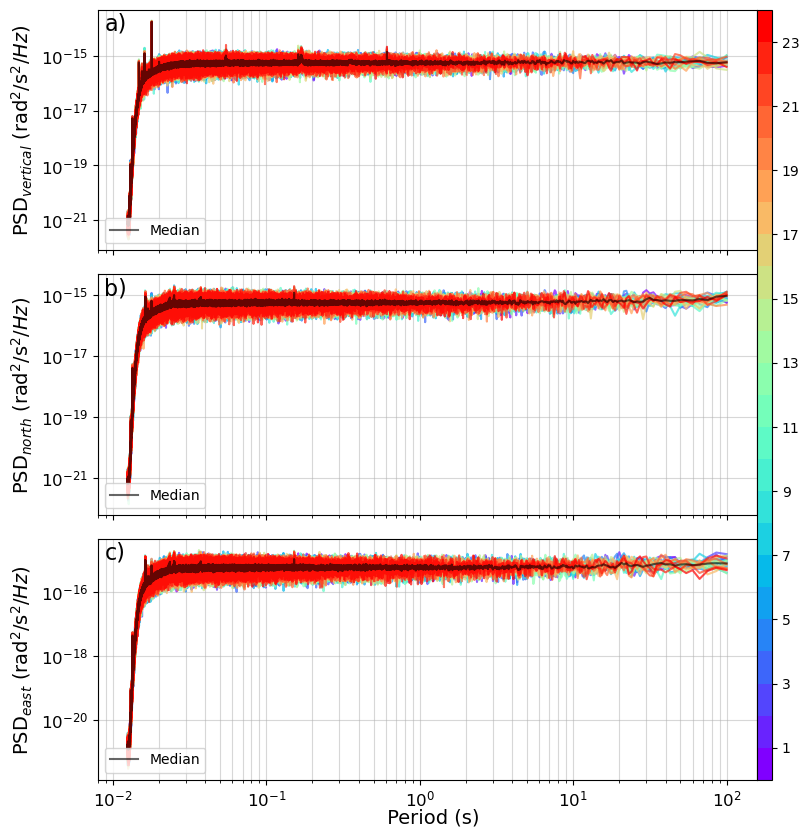


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230524.png ...

   -> Done

2023_BSPF_Z_3600_20230525_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


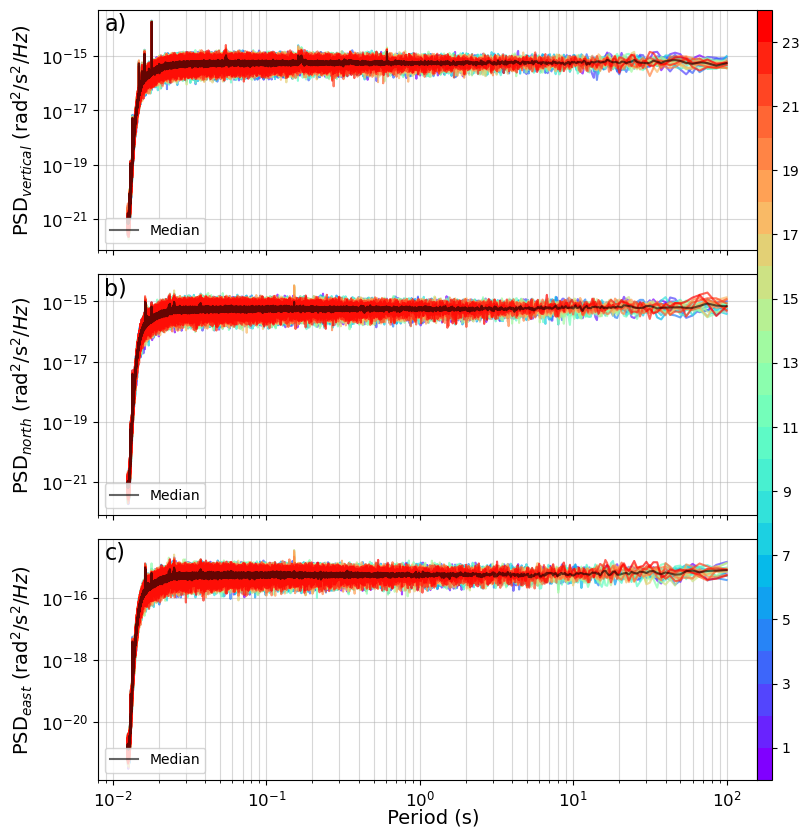


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230525.png ...

   -> Done

2023_BSPF_Z_3600_20230526_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


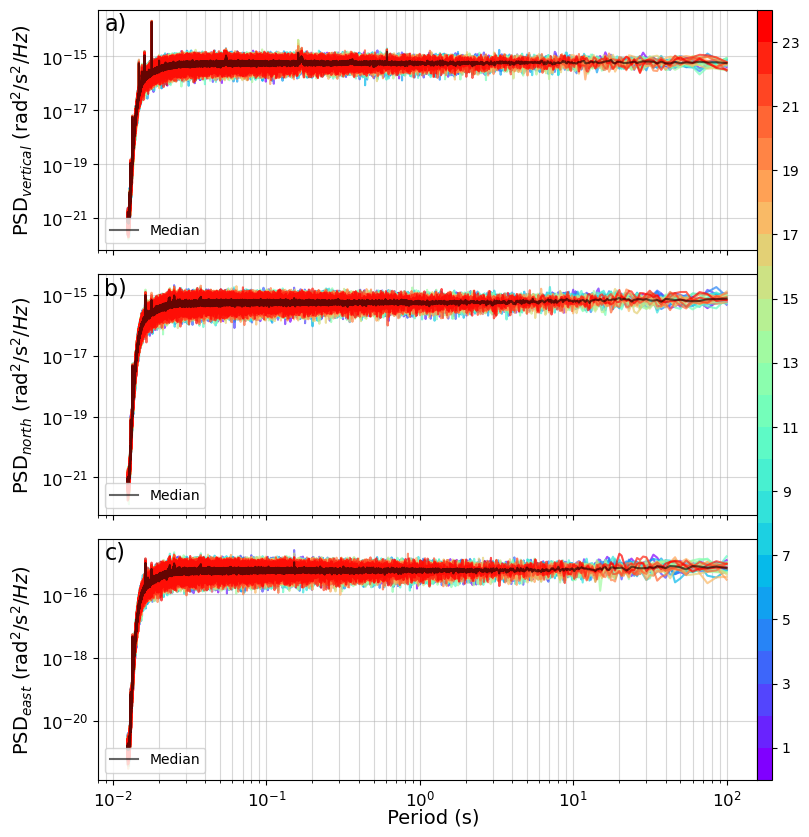


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230526.png ...

   -> Done

2023_BSPF_Z_3600_20230527_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


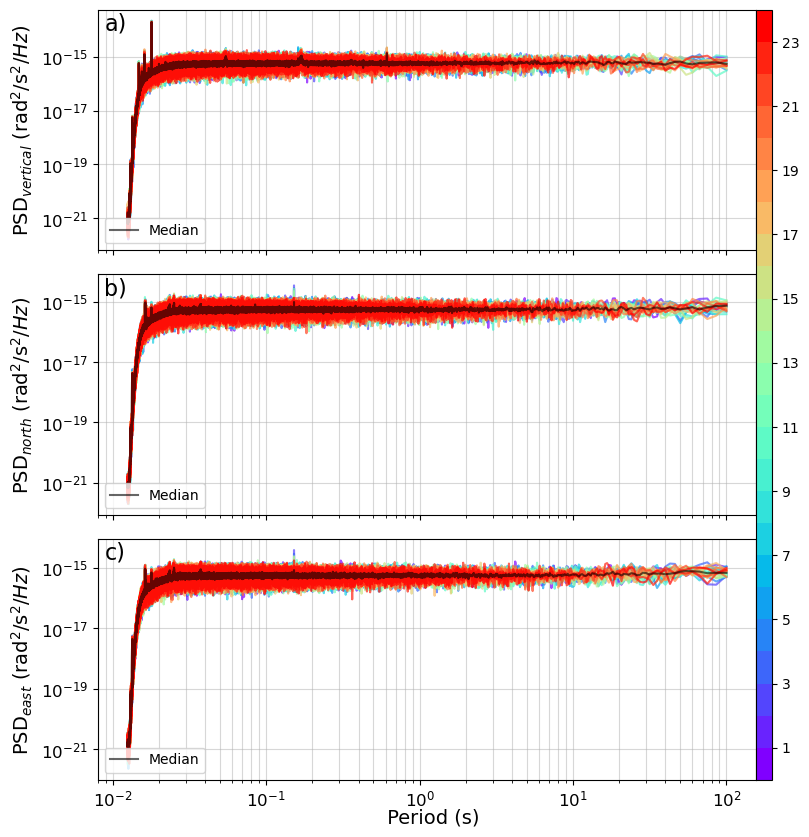


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230527.png ...

   -> Done

2023_BSPF_Z_3600_20230528_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


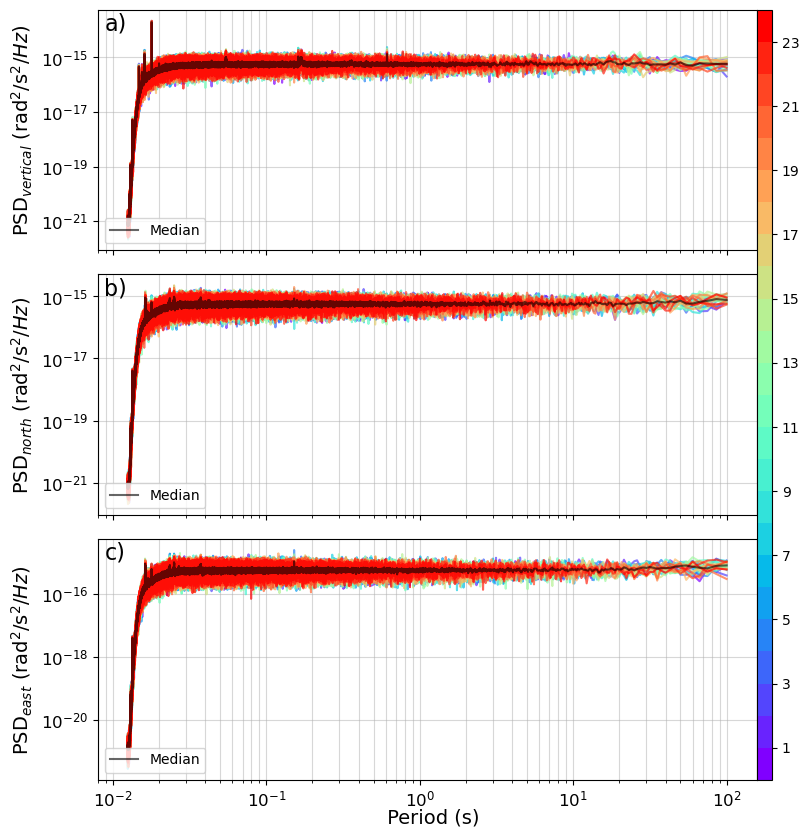


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230528.png ...

   -> Done

2023_BSPF_Z_3600_20230529_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


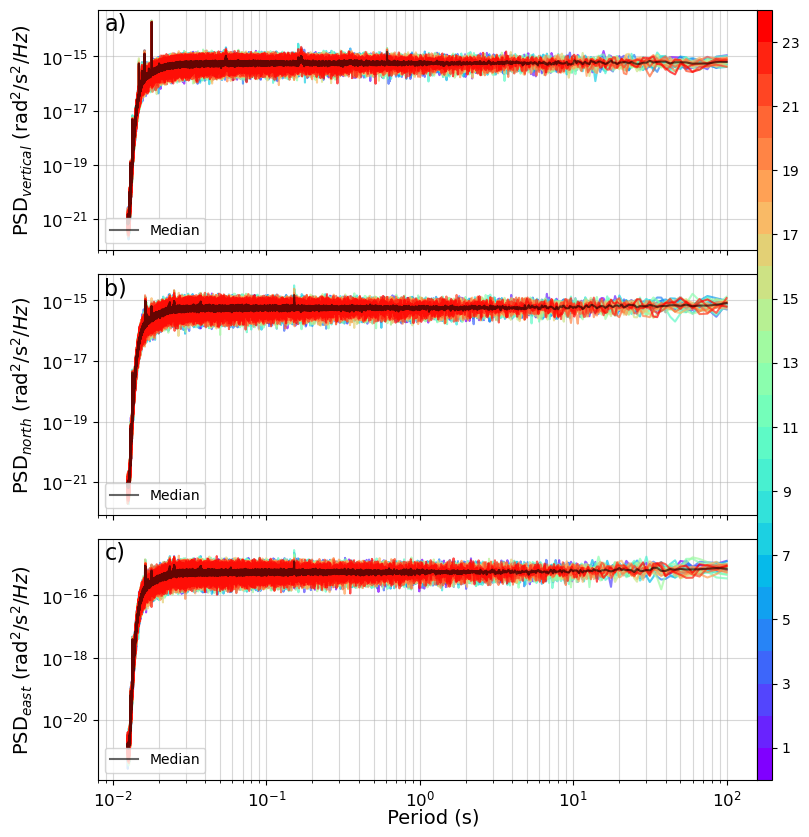


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230529.png ...

   -> Done

2023_BSPF_Z_3600_20230530_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


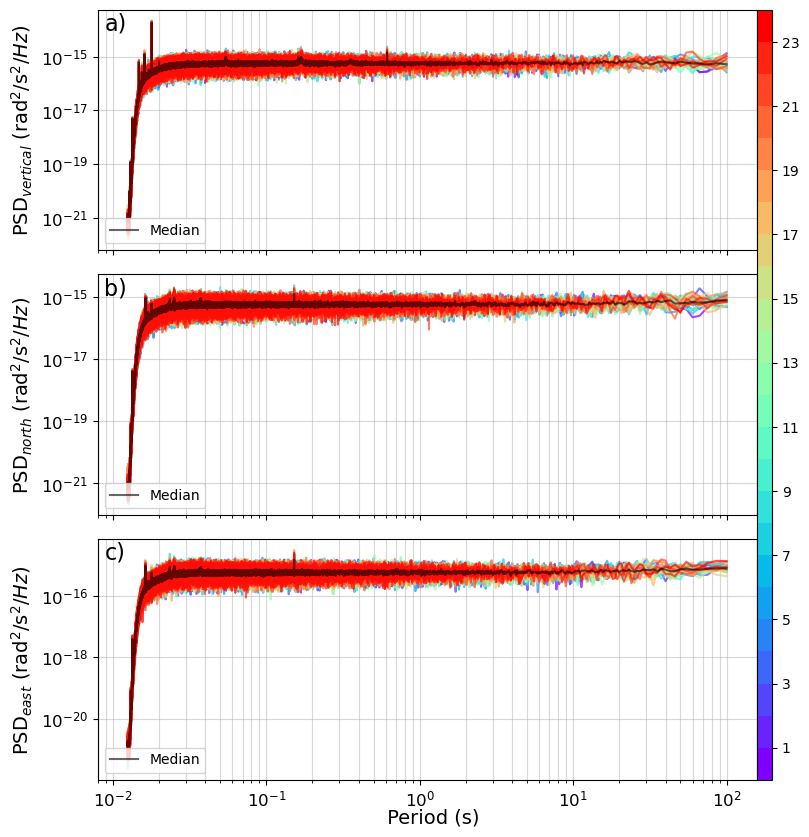


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230530.png ...

   -> Done

2023_BSPF_Z_3600_20230531_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


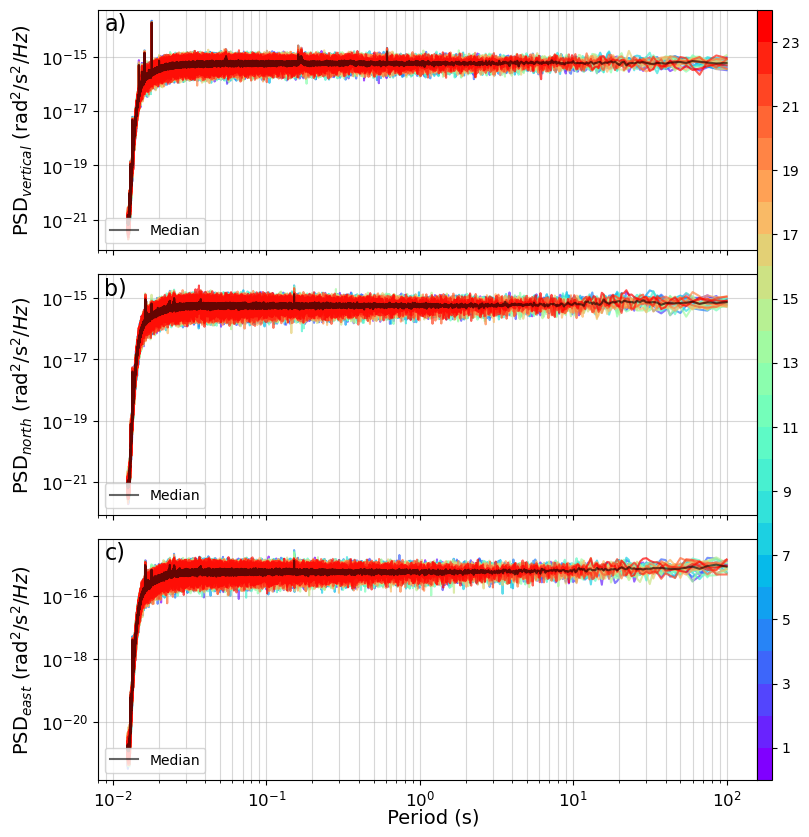


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230531.png ...

   -> Done

2023_BSPF_Z_3600_20230601_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


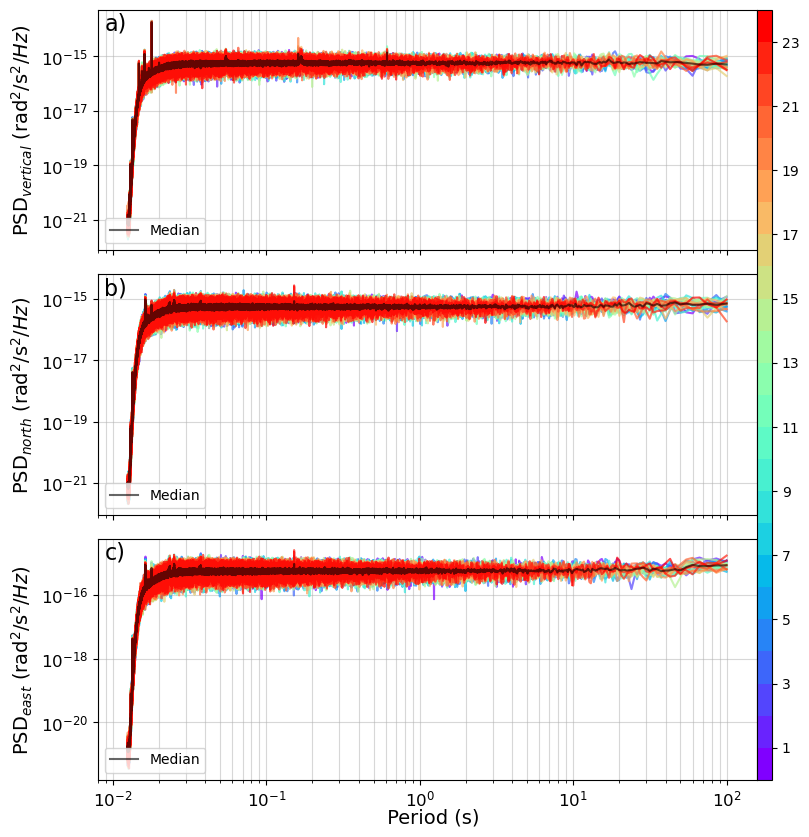


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230601.png ...

   -> Done

2023_BSPF_Z_3600_20230602_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


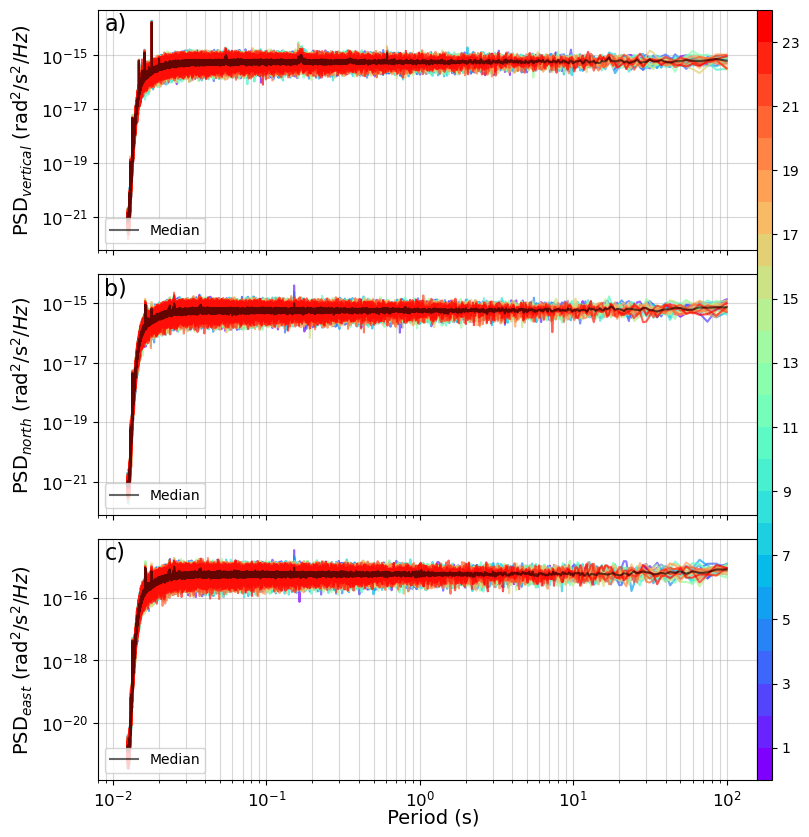


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230602.png ...

   -> Done

2023_BSPF_Z_3600_20230603_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


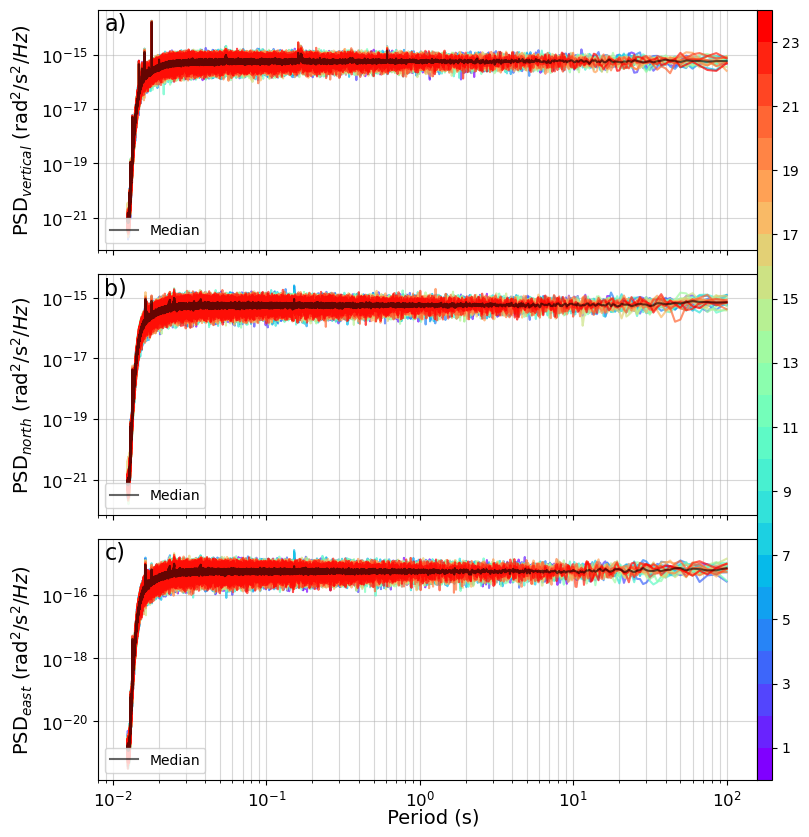


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230603.png ...

   -> Done

2023_BSPF_Z_3600_20230604_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


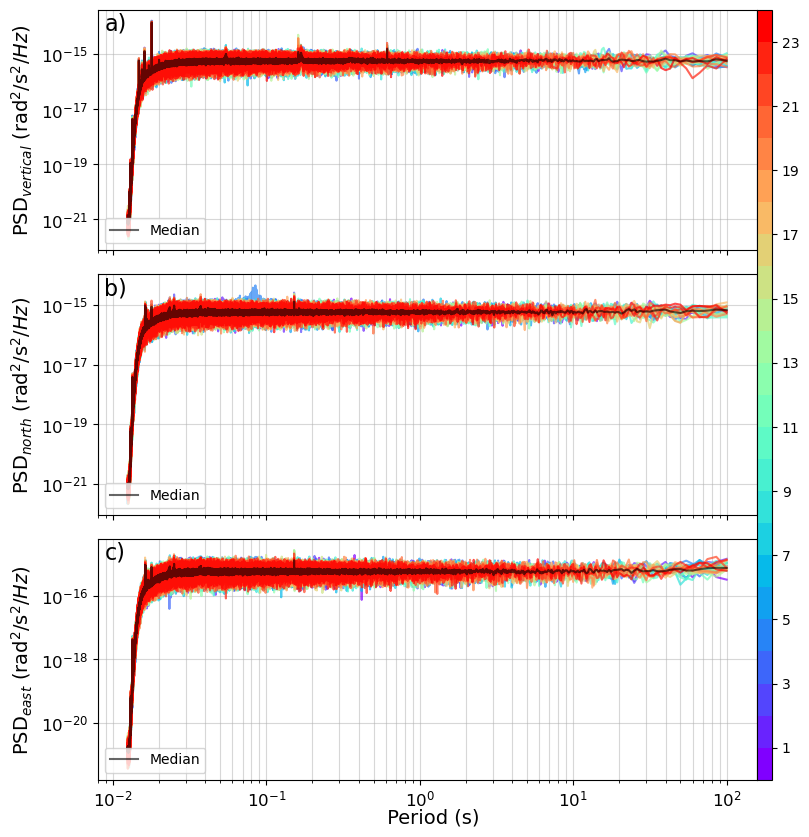


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230604.png ...

   -> Done

2023_BSPF_Z_3600_20230605_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


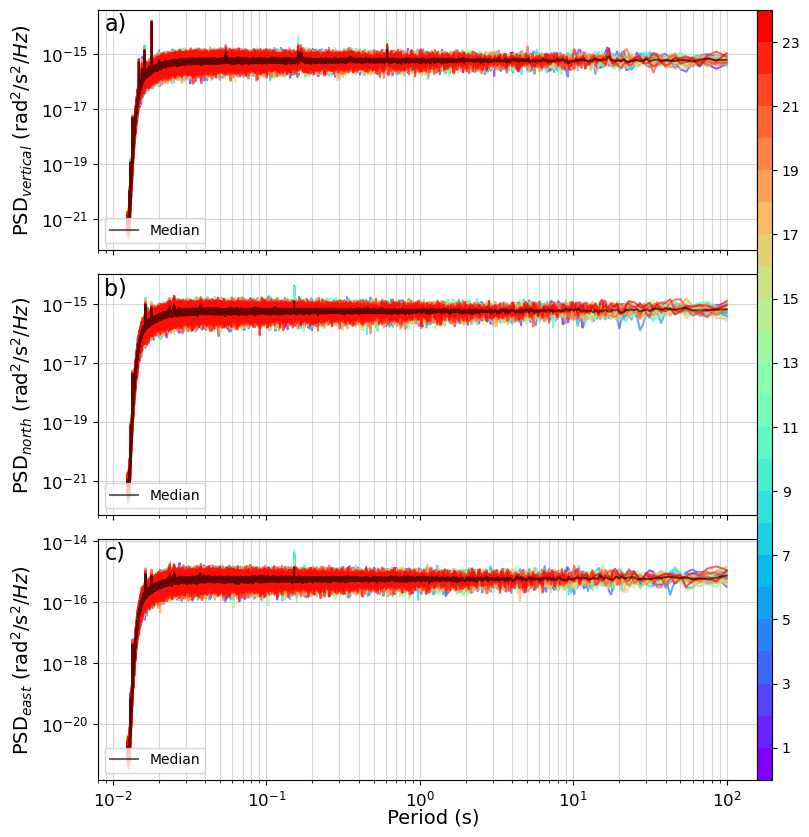


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230605.png ...

   -> Done

2023_BSPF_Z_3600_20230606_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


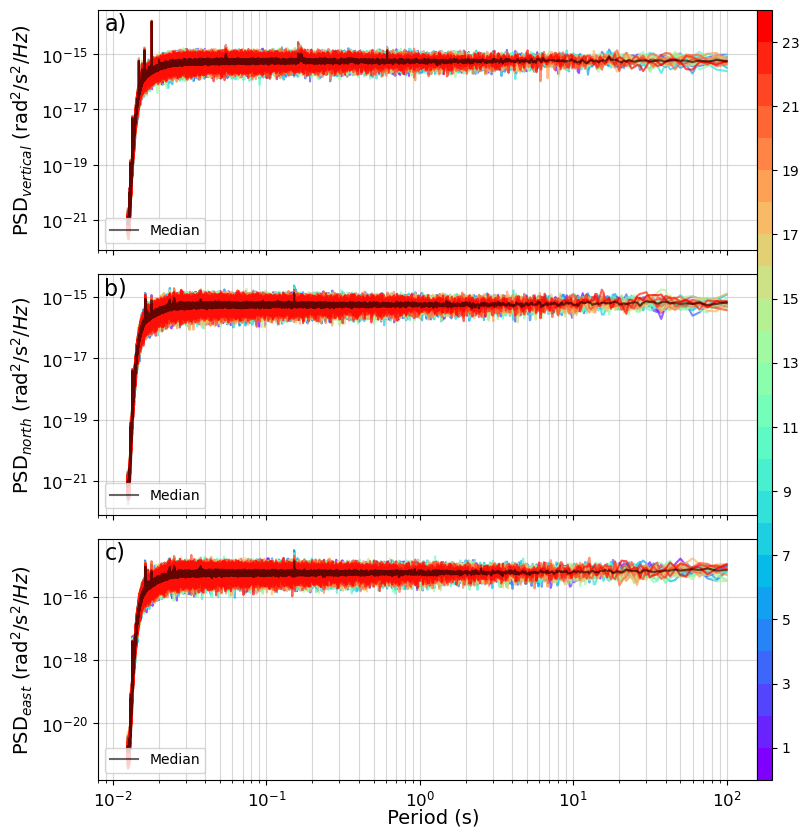


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230606.png ...

   -> Done

2023_BSPF_Z_3600_20230607_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


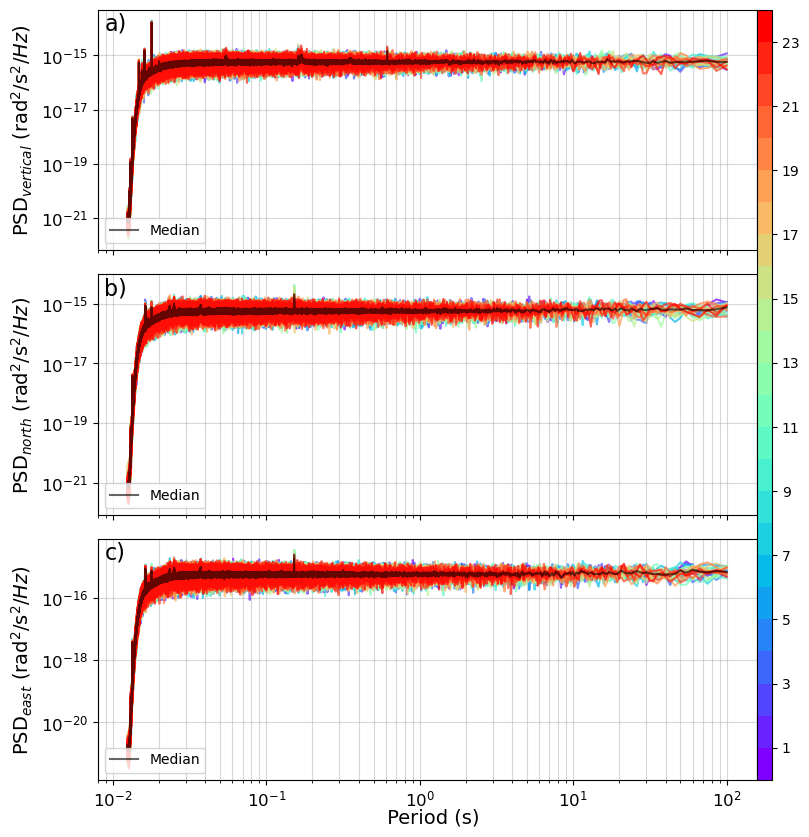


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230607.png ...

   -> Done

2023_BSPF_Z_3600_20230608_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


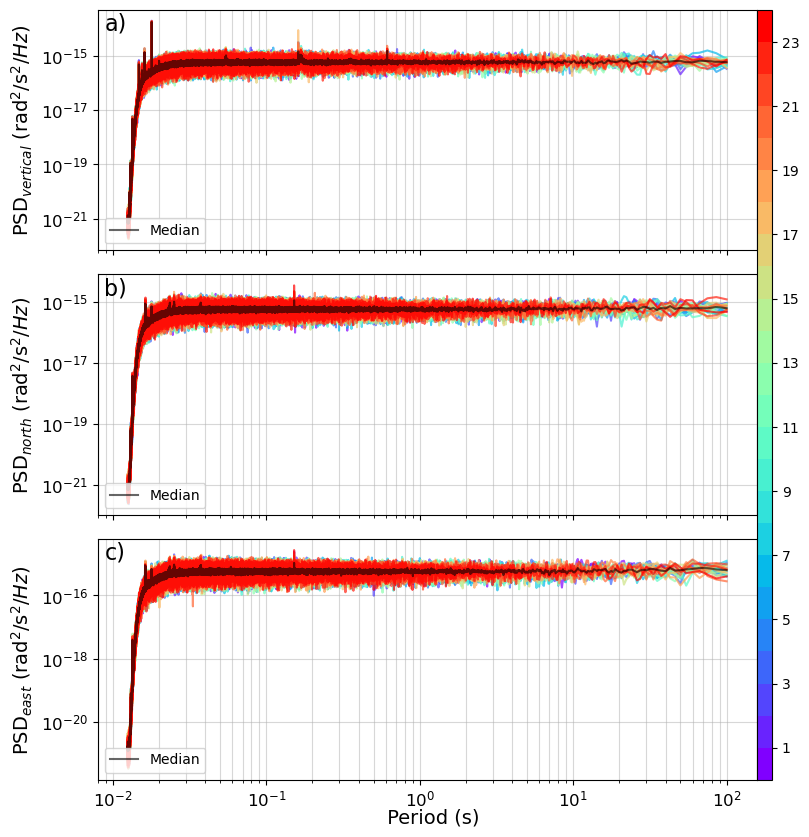


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230608.png ...

   -> Done

2023_BSPF_Z_3600_20230609_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


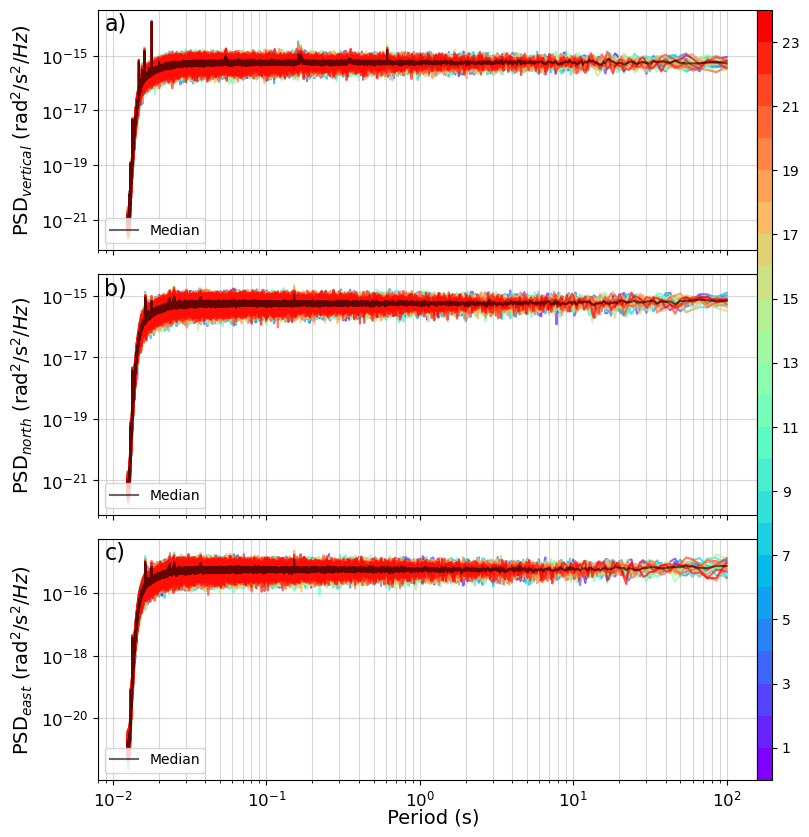


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230609.png ...

   -> Done

2023_BSPF_Z_3600_20230610_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


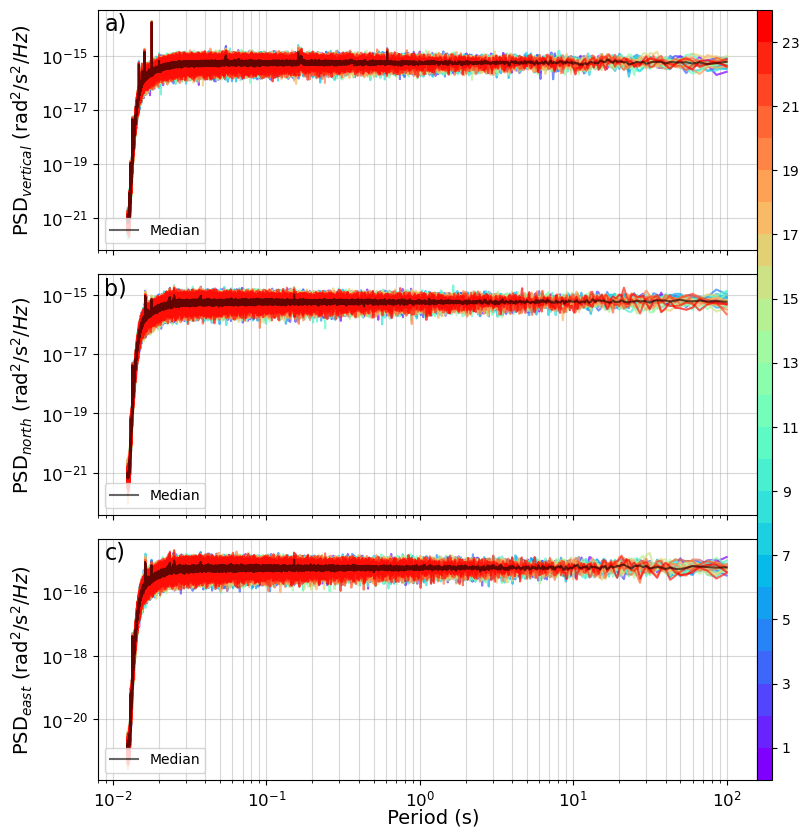


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230610.png ...

   -> Done

2023_BSPF_Z_3600_20230611_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


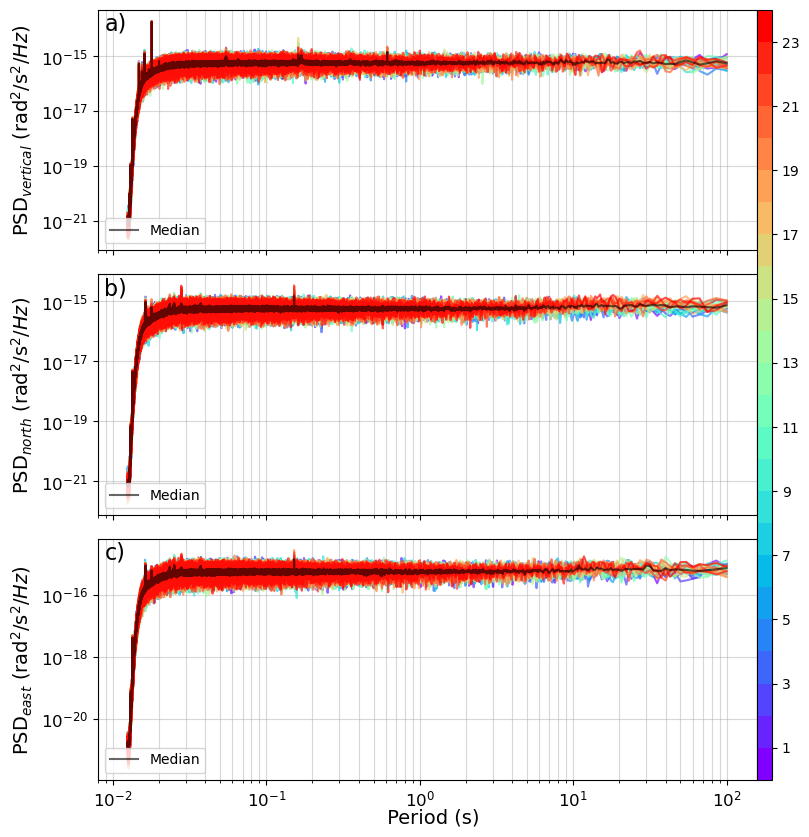


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230611.png ...

   -> Done

2023_BSPF_Z_3600_20230612_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


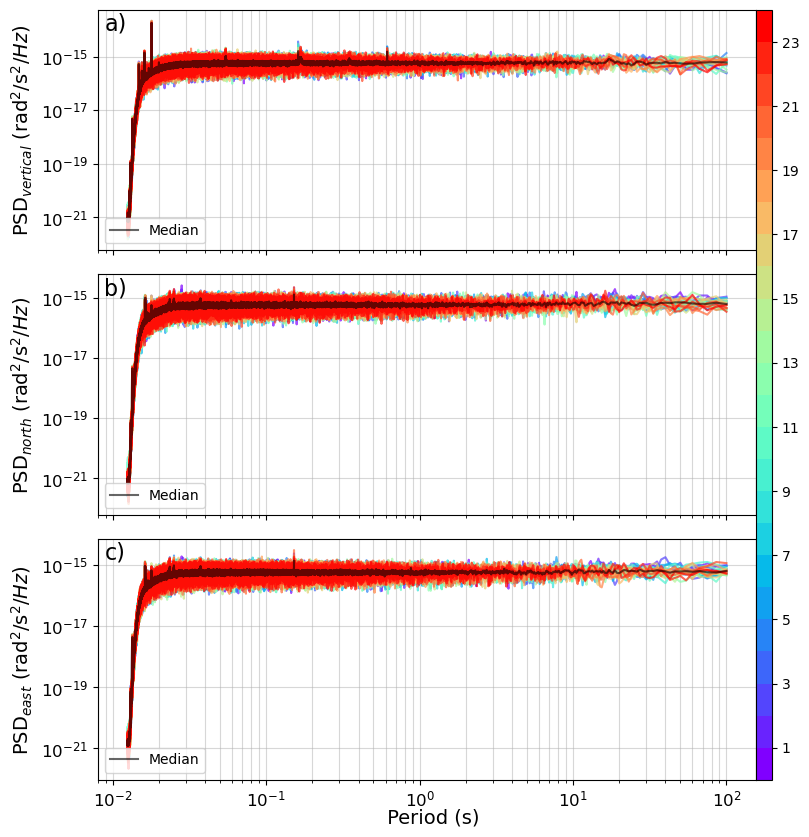


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230612.png ...

   -> Done

2023_BSPF_Z_3600_20230613_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


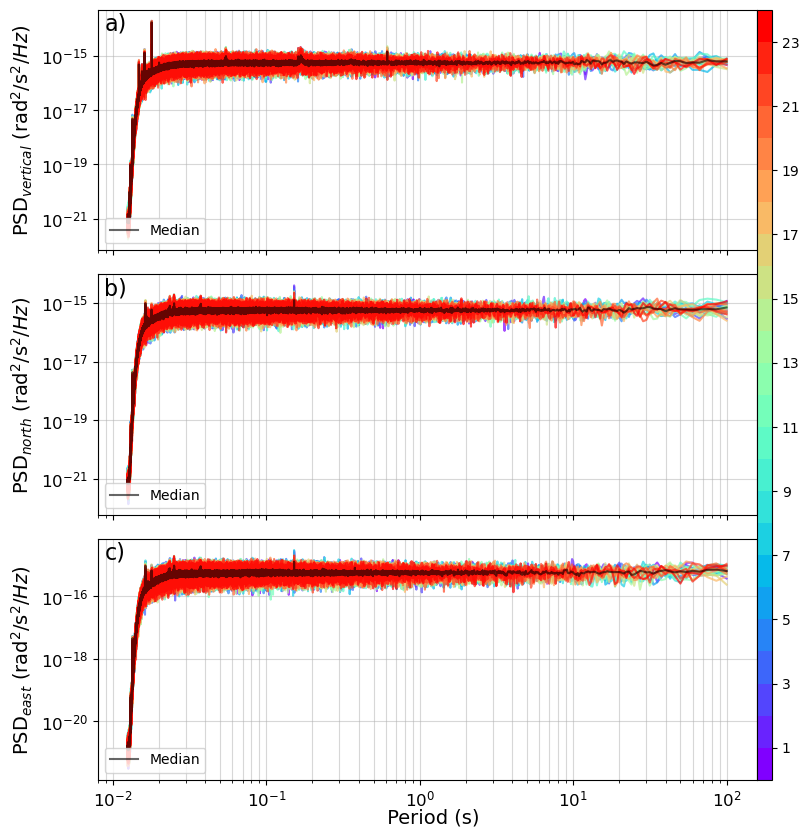


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230613.png ...

   -> Done

2023_BSPF_Z_3600_20230614_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


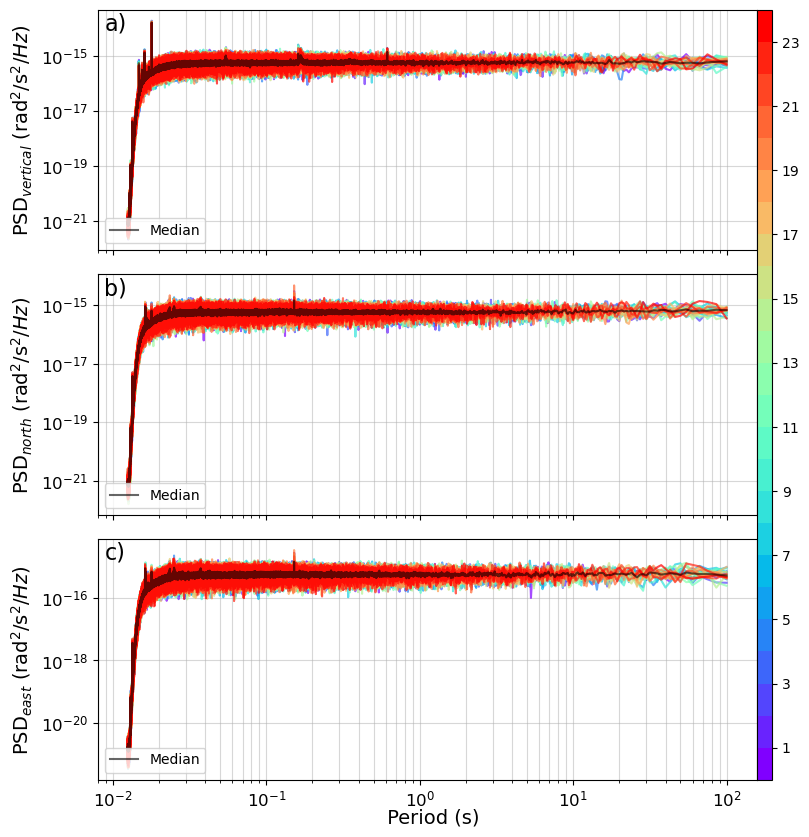


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230614.png ...

   -> Done

2023_BSPF_Z_3600_20230615_hourly.pkl
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain
 -> removed 0 rows due to mean thresholds!
 -> 24 psds remain


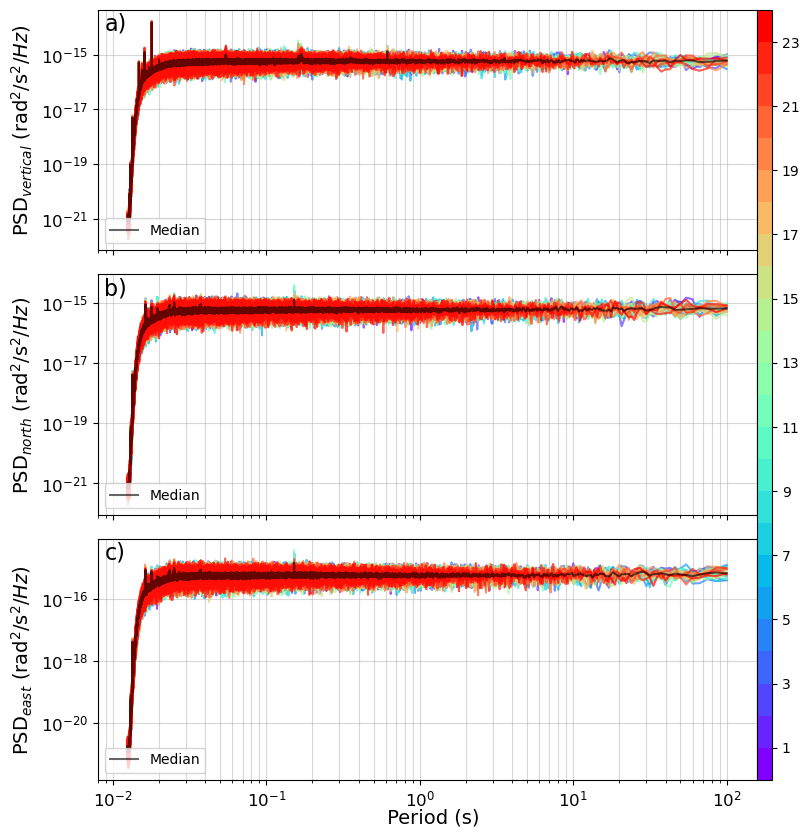


   -> saving /home/andbro/kilauea-data/BSPF/figures_colorlines/BSPF_20230615.png ...

   -> Done



In [16]:
config['files'] = [file for file in os.listdir(config['inpath']) if "hourly" in file]
config['files'].sort()

psds_medians_out, times_out = [],[]

for file in config['files']:

    print(file)
    
    day = file.split("_")[-2]
    
    config['outpath_figname'] = config['station']+"_"+day
    
    if os.path.isfile(config['outpath_figures']+config['outpath_figname']):
        continue

    ff_Z = pickle.load(open(f"{config['inpath'].replace('Z','Z')}{config['inname'].replace('Z','Z')}_frequency_axis.pkl", 'rb'))
    ff_N = pickle.load(open(f"{config['inpath'].replace('Z','N')}{config['inname'].replace('Z','N')}_frequency_axis.pkl", 'rb'))
    ff_E = pickle.load(open(f"{config['inpath'].replace('Z','E')}{config['inname'].replace('Z','E')}_frequency_axis.pkl", 'rb'))
        
    ADR_Z = __load_data_file(config['inpath'].replace("Z","Z"), file.replace("Z","Z"))        
    ADR_N = __load_data_file(config['inpath'].replace("Z","N"), file.replace("Z","N"))        
    ADR_E = __load_data_file(config['inpath'].replace("Z","E"), file.replace("Z","E"))        

    ADR_N, ff_N = __cut_frequencies_array(ADR_N, ff_N, config['frequency_limits'][0], config['frequency_limits'][1])
    ADR_E, ff_E = __cut_frequencies_array(ADR_E, ff_E, config['frequency_limits'][0], config['frequency_limits'][1])
    ADR_Z, ff_Z = __cut_frequencies_array(ADR_Z, ff_Z, config['frequency_limits'][0], config['frequency_limits'][1])
        
    ADR_N, rejected_N = __remove_noisy_psds(ADR_N, threshold_mean=config['thres'])
    ADR_E, rejected_E = __remove_noisy_psds(ADR_E, threshold_mean=config['thres'])
    ADR_Z, rejected_Z = __remove_noisy_psds(ADR_Z, threshold_mean=config['thres'])
        
    fig = __makeplot_colorlines_overview(config, 
                                         [ff_Z, ff_N, ff_E], 
                                         [ADR_Z, ADR_N, ADR_E], 
                                         [rejected_Z, rejected_N, rejected_E],
                                         day)
    

#     fig.savefig(config['outpath_figures']+config['outpath_figname'], format="png", transparent=False)
    __savefig(fig, outpath=config['outpath_figures'], outname=config['outpath_figname'], mode="png", dpi=300)   

    ## output data
#     psds_medians_out.append(psds_median)
#     times_out.append(time)
    
# ## write output
# output = {"times": array(times_out).astype(int), "frequencies": array(ff), "psds_medians": array(psds_medians_out)}

# with open(f"{config['inpath']}{config['inname']}_psds_filtered_medians.pkl", 'wb') as file:
#     pickle.dump(output, file, protocol=pickle.HIGHEST_PROTOCOL)
